In [1]:
from memflow.read_data.dataset_all import DatasetCombined
from memflow.unfolding_network.conditional_transformer import ConditioningTransformerLayer
from memflow.unfolding_flow.utils import *
from memflow.unfolding_flow.unfolding_flow import UnfoldingFlow

import numpy as np
import scipy.stats as st
import torch
from torch import optim
from torch.utils.data import DataLoader
import torch.nn as nn
from torch.nn.functional import normalize
from torch.optim.lr_scheduler import CosineAnnealingLR

import matplotlib.pyplot as plt
from matplotlib.colors import LogNorm
import matplotlib as mpl
from matplotlib import cm

from tensorboardX import SummaryWriter
from omegaconf import OmegaConf
import sys
import argparse
import os
from pynvml import *
from hist import Hist
import hist
import vector
import mplhep
import awkward as ak
import random

from memflow.read_data.utils import to_flat_tensor
from memflow.phasespace.phasespace import PhaseSpace

from utils import FindMasks
from utils import SavePlots

pi = torch.pi

In [2]:
batchSize = 1024
path_data = '../../dataset/v7/all_jets_fullRun2_v1.parquet'
device = torch.device('cpu')

path_flow = 'results_pretraining_eta_correct_21June/noProv/preTraining-MEMFlow_noprov-eta_v00_v0/UnfFlowEps_LongerTr_AndDiffArch_29July/results_DiagNormal_FirstArg:0_Autoreg:False_NoTransf:20_NoBins:30_DNN:6:128/model_flow.pt'
path_to_conf = 'results_pretraining_eta_correct_21June/noProv/preTraining-MEMFlow_noprov-eta_v00_v0/UnfFlowEps_LongerTr_AndDiffArch_29July/results_DiagNormal_FirstArg:0_Autoreg:False_NoTransf:20_NoBins:30_DNN:6:128/config_preTraining-MEMFlow_noprov-eta_v00_v0.yaml'

with open(path_to_conf) as f:
        conf = OmegaConf.load(path_to_conf)

model = UnfoldingFlow(model_path=path_flow,
                    read_CondTransf=False,
                    log_mean = conf.scaling_params.log_mean,
                    log_std = conf.scaling_params.log_std,
                    no_jets=conf.input_shape.number_jets,
                    no_lept=conf.input_shape.number_lept,
                    input_features=conf.input_shape.input_features,
                    cond_hiddenFeatures=conf.conditioning_transformer.hidden_features,
                    cond_dimFeedForward=conf.conditioning_transformer.dim_feedforward_transformer,
                    cond_outFeatures=conf.conditioning_transformer.out_features,
                    cond_nheadEncoder=conf.conditioning_transformer.nhead_encoder,
                    cond_NoLayersEncoder=conf.conditioning_transformer.no_layers_encoder,
                    cond_nheadDecoder=conf.conditioning_transformer.nhead_decoder,
                    cond_NoLayersDecoder=conf.conditioning_transformer.no_layers_decoder,
                    cond_NoDecoders=conf.conditioning_transformer.no_decoders,
                    cond_aggregate=conf.conditioning_transformer.aggregate,
                    flow_nfeatures=conf.unfolding_flow.nfeatures,
                    flow_ncond=conf.unfolding_flow.ncond, 
                    flow_ntransforms=conf.unfolding_flow.ntransforms,
                    flow_hiddenMLP_NoLayers=conf.unfolding_flow.hiddenMLP_NoLayers, 
                    flow_hiddenMLP_LayerDim=conf.unfolding_flow.hiddenMLP_LayerDim,
                    flow_bins=conf.unfolding_flow.bins,
                    flow_autoregressive=conf.unfolding_flow.autoregressive,
                    flow_base=conf.unfolding_flow.base,
                    flow_base_first_arg=conf.unfolding_flow.base_first_arg,
                    flow_base_second_arg=conf.unfolding_flow.base_second_arg,
                    flow_bound=conf.unfolding_flow.bound,
                    device=device,
                    dtype=torch.float64)

state_dict = torch.load(path_flow, map_location=device)
model.load_state_dict(state_dict['model_state_dict'])
model.eval()

UnfoldingFlow(
  (cond_transformer): ConditioningTransformerLayer(
    (lin_input): Linear(in_features=4, out_features=127, bias=True)
    (lin_boost): Linear(in_features=4, out_features=127, bias=True)
    (gelu): GELU(approximate='none')
    (transformer_encoder): TransformerEncoder(
      (layers): ModuleList(
        (0): TransformerEncoderLayer(
          (self_attn): MultiheadAttention(
            (out_proj): NonDynamicallyQuantizableLinear(in_features=128, out_features=128, bias=True)
          )
          (linear1): Linear(in_features=128, out_features=512, bias=True)
          (dropout): Dropout(p=0.1, inplace=False)
          (linear2): Linear(in_features=512, out_features=128, bias=True)
          (norm1): LayerNorm((128,), eps=1e-05, elementwise_affine=True)
          (norm2): LayerNorm((128,), eps=1e-05, elementwise_affine=True)
          (dropout1): Dropout(p=0.1, inplace=False)
          (dropout2): Dropout(p=0.1, inplace=False)
        )
        (1): TransformerEncoder

In [3]:
E_CM = 13000
phasespace = PhaseSpace(E_CM, [21,21], [21,6,-6,25])

if (conf.cartesian):
    data = DatasetCombined(conf.input_dataset, dev=device, dtype=torch.float64, build=True,
                                reco_list=['scaledLogRecoParticlesCartesian', 'mask_lepton', 
                                            'mask_jets','mask_met',
                                            'mask_boost', 'data_boost'],
                                parton_list=['phasespace_intermediateParticles_onShell',
                                            'phasespace_rambo_detjacobian_onShell'])
else:
    data = DatasetCombined(conf.input_dataset, dev=device, dtype=torch.float64, build=True,
                                reco_list=['scaledLogRecoParticles', 'mask_lepton', 
                                            'mask_jets','mask_met',
                                            'mask_boost', 'data_boost'],
                                parton_list=['phasespace_intermediateParticles_onShell',
                                            'phasespace_rambo_detjacobian_onShell'])
    
data_loader = DataLoader(dataset=data, shuffle=False, batch_size=32)
dataCorrect = data.parton_data.data_higgs_t_tbar_ISR_cartesian
PS_target = data.parton_data.phasespace_intermediateParticles_onShell

higgsCorrect = vector.array(
    {
        "E": dataCorrect[:,0,0].detach().numpy(),
        "px": dataCorrect[:,0,1].detach().numpy(),
        "py": dataCorrect[:,0,2].detach().numpy(),
        "pz": dataCorrect[:,0,3].detach().numpy(),
    }
)

thadCorrect = vector.array(
    {
        "E": dataCorrect[:,1,0].detach().numpy(),
        "px": dataCorrect[:,1,1].detach().numpy(),
        "py": dataCorrect[:,1,2].detach().numpy(),
        "pz": dataCorrect[:,1,3].detach().numpy(),
    }
)

tlepCorrect = vector.array(
    {
        "E": dataCorrect[:,2,0].detach().numpy(),
        "px": dataCorrect[:,2,1].detach().numpy(),
        "py": dataCorrect[:,2,2].detach().numpy(),
        "pz": dataCorrect[:,2,3].detach().numpy(),
    }
)

glISRCorrect = vector.array(
    {
        "E": dataCorrect[:,3,0].detach().numpy(),
        "px": dataCorrect[:,3,1].detach().numpy(),
        "py": dataCorrect[:,3,2].detach().numpy(),
        "pz": dataCorrect[:,3,3].detach().numpy(),
    }
)

higgsCorrect = ak.with_name(higgsCorrect, name="Momentum4D")
thadCorrect = ak.with_name(thadCorrect, name="Momentum4D")
tlepCorrect = ak.with_name(tlepCorrect, name="Momentum4D")
glISRCorrect = ak.with_name(glISRCorrect, name="Momentum4D")


RecoLevel
Reading reco_level Files
Load scaledLogRecoParticles

PartonLevel
Reading parton_level Files
Load phasespace_intermediateParticles_onShell



In [4]:
def plot_var2d(higgs_var1, higgs_var2, thad_var1, thad_var2, tlep_var1, tlep_var2,
             ISR_var1, ISR_var2, name1, name2, nameFig, start1=0, stop1=1000, start2=0, stop2=1000, bins1=100, bins2=100,
             higgs_mask=1, thad_mask=1, tlep_mask=1, ISR_mask=1, neg_Mask=False, log=False, name='da', nameunit=''):
        
        
        if neg_Mask:
            higgs_mask = np.logical_not(higgs_mask)
            thad_mask = np.logical_not(thad_mask)
            tlep_mask = np.logical_not(tlep_mask)
            ISR_mask = np.logical_not(ISR_mask)

        # Quick construction, no other imports needed:
        hist2d_var_higgs = (
          Hist.new
          .Reg(bins=bins1, start=start1, stop=stop1, name=name1, label=name1)
          .Reg(bins=bins2, start=start2, stop=stop2, name=name2, label=name2)
          .Double())

        hist2d_var_thad = (
          Hist.new
          .Reg(bins=bins1, start=start1, stop=stop1, name=name1, label=name1)
          .Reg(bins=bins2, start=start2, stop=stop2, name=name2, label=name2)
          .Double())

        hist2d_var_tlep = (
          Hist.new
          .Reg(bins=bins1, start=start1, stop=stop1, name=name1, label=name1)
          .Reg(bins=bins2, start=start2, stop=stop2, name=name2, label=name2)
          .Double())

        hist2d_var_ISR = (
          Hist.new
          .Reg(bins=bins1, start=start1, stop=stop1, name=name1, label=name1)
          .Reg(bins=bins2, start=start2, stop=stop2, name=name2, label=name2)
          .Double())

        hist2d_var_higgs.fill(higgs_var1[higgs_mask],
                            higgs_var2[higgs_mask])

        hist2d_var_thad.fill(thad_var1[thad_mask],
                            thad_var2[thad_mask])

        hist2d_var_tlep.fill(tlep_var1[tlep_mask],
                            tlep_var2[tlep_mask])

        hist2d_var_ISR.fill(ISR_var1[ISR_mask],
                            ISR_var2[ISR_mask])

        colormap='viridis'
        my_viridis = mpl.colormaps[colormap].with_extremes(under="white")
        
        fontsize = 20
        labelsize=14
        labels = ['higgs', 'thad', 'tlep', 'ISR']
        hist2d_list = [hist2d_var_higgs, hist2d_var_thad, hist2d_var_tlep, hist2d_var_ISR]
        
        
        fig, axs = plt.subplots(1, 4, figsize=(16, 6))

        if log:
            for i in range(4):
                w, x, y = hist2d_list[i].to_numpy()
                mesh = axs[i].pcolormesh(x, y, w.T, cmap=my_viridis, norm=mpl.colors.LogNorm(vmin=1))
                axs[i].set_xlabel(f"{name}-correct {nameunit}", fontsize=fontsize)
                axs[i].set_ylabel(f"{name}-regressed {nameunit}", fontsize=fontsize)
                axs[i].set_title(f"{labels[i]}", fontsize=fontsize)
                axs[i].tick_params(axis='both', which='major', labelsize=labelsize)
                cbar = fig.colorbar(mesh)
                cbar.ax.tick_params(labelsize=labelsize)
                plt.tight_layout()

        else:
            for i in range(4):
                w, x, y = hist2d_list[i].to_numpy()
                mesh = axs[i].pcolormesh(x, y, w.T, cmap=my_viridis, vmin=1)
                axs[i].set_xlabel(f"{name}-correct {nameunit}", fontsize=fontsize)
                axs[i].set_ylabel(f"{name}-regressed {nameunit}", fontsize=fontsize)
                axs[i].set_title(f"{labels[i]}", fontsize=fontsize)
                axs[i].tick_params(axis='both', which='major', labelsize=labelsize)
                cbar = fig.colorbar(mesh)
                cbar.ax.tick_params(labelsize=labelsize)
                plt.tight_layout()

# 1st version: 1 sample for many events

In [5]:
def get_particle_awkward(momenta):
    
    higgs = momenta[:,0]
    thad = momenta[:,1]
    tlep = momenta[:,2]
    ISR = momenta[:,3]
    
    higgs = vector.array(
                {
                "E": higgs[:,0].detach().numpy(),
                "px": higgs[:,1].detach().numpy(),
                "py": higgs[:,2].detach().numpy(),
                "pz": higgs[:,3].detach().numpy()
                }
            )

    thad = vector.array(
                {
                "E": thad[:,0].detach().numpy(),
                "px": thad[:,1].detach().numpy(),
                "py": thad[:,2].detach().numpy(),
                "pz":thad[:,3].detach().numpy(),
                }
            )

    tlep = vector.array(
                {
                "E": tlep[:,0].detach().numpy(),
                "px": tlep[:,1].detach().numpy(),
                "py": tlep[:,2].detach().numpy(),
                "pz": tlep[:,3].detach().numpy(),
                }
            )
    
    ISR = vector.array(
                {
                "E": ISR[:,0].detach().numpy(),
                "px": ISR[:,1].detach().numpy(),
                "py": ISR[:,2].detach().numpy(),
                "pz": ISR[:,3].detach().numpy(),
                }
            )
    
    higgs = ak.with_name(higgs, name="Momentum4D")
    thad = ak.with_name(thad, name="Momentum4D")
    tlep = ak.with_name(tlep, name="Momentum4D")
    ISR = ak.with_name(ISR, name="Momentum4D")
    
    return higgs, thad, tlep, ISR

def get_particle(data, indices, config, N_samples):
    logScaled_reco = data.reco_data.scaledLogRecoParticles[indices]
    mask_lepton_reco = data.reco_data.mask_lepton[indices]
    mask_jets = data.reco_data.mask_jets[indices]
    mask_met = data.reco_data.mask_met[indices]
    mask_boost_reco = data.reco_data.mask_boost[indices]
    data_boost_reco = data.reco_data.data_boost[indices]
    
    print('before model')
    
    cond_X, PS_regressed = model(mask_jets=mask_jets, mask_lepton_reco=mask_lepton_reco,
                                mask_met=mask_met, mask_boost_reco=mask_boost_reco,
                                logScaled_reco=logScaled_reco, data_boost_reco=data_boost_reco, 
                                device=device, noProv=config.noProv, eps=config.training_params.eps,
                                order=config.training_params.order)
    
    print(f'after model, before sampling: PS_regressed: {PS_regressed.shape}')
    ps_new = model.flow(PS_regressed).sample((N_samples,))
    
    if len(indices) == 1:
        print('Case: 1 event, many samples')
        ps_new = ps_new.squeeze(dim=1)
    else:
        print('Case: many events, 1 sample')
        ps_new = ps_new[0]
        
    print(f'after sampling: ps_new_shape: {ps_new.shape}')
    
    # for the moment, take only the first sample
    momenta, weight, x1pp, x2pp = phasespace.get_momenta_from_ps(ps_new)
    final_momenta = momenta[:,2:]
    
    higgs, thad, tlep, ISR = get_particle_awkward(final_momenta)
        
    return PS_regressed, ps_new, higgs, thad, tlep, ISR

def get_particle_target(higgs, thad, tlep, ISR, indices):
    return higgs[indices], thad[indices], tlep[indices], ISR[indices]


In [64]:
Number_events = 10000
N_samples = 1

randomlist = random.sample(range(0, dataCorrect.shape[0]-1), Number_events)

ps_regressed, ps_new, higgs_flow, thad_flow, tlep_flow, ISR_flow = get_particle(data, randomlist, conf, N_samples)
higgs_target, thad_target, tlep_target, ISR_target = get_particle_target(higgsCorrect, thadCorrect,
                                                                         tlepCorrect, glISRCorrect, randomlist)

before model
after model, before sampling: PS_regressed: torch.Size([10000, 10])
Case: many events, 1 sample
after sampling: ps_new_shape: torch.Size([10000, 10])


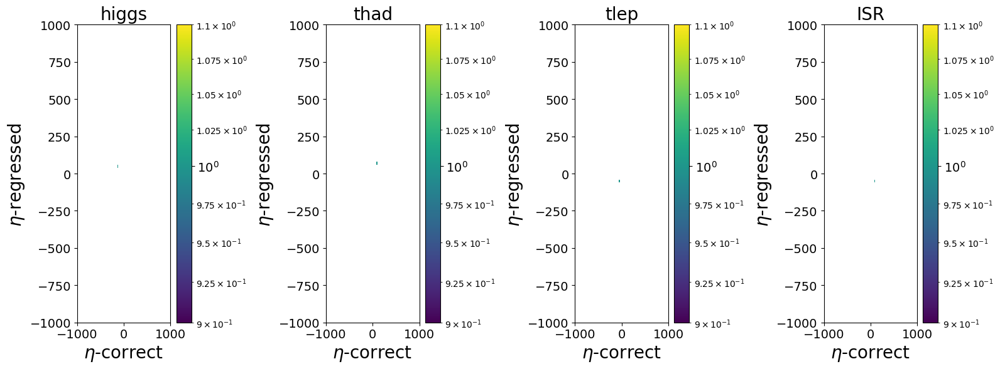

In [65]:
plot_var2d(higgs_var1=higgs_target.px, higgs_var2=higgs_flow.px,
           thad_var1=thad_target.px, thad_var2=thad_flow.px,
           tlep_var1=tlep_target.px, tlep_var2=tlep_flow.px,
           ISR_var1=ISR_target.px, ISR_var2=ISR_flow.px,
           name1='$eta-correct$', name2='$eta-regressed$', nameFig='29.png', 
           start1=-1000, stop1=1000, start2=-1000, stop2=1000, bins1=100, bins2=100,
           higgs_mask=1, thad_mask=1, tlep_mask=1, ISR_mask=1,
           neg_Mask=False, log=True, name='$\eta$')

In [66]:
index=10
print(higgs_flow[index])
print(higgs_target[index])

{x: -138, y: 95, z: -30.3, t: 170}
{x: -135, y: 130, z: -69.5, t: 235}


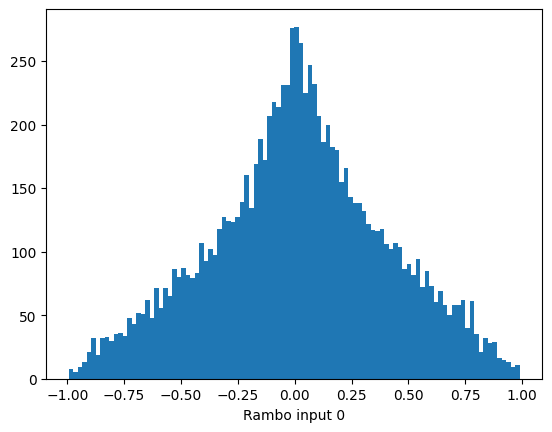

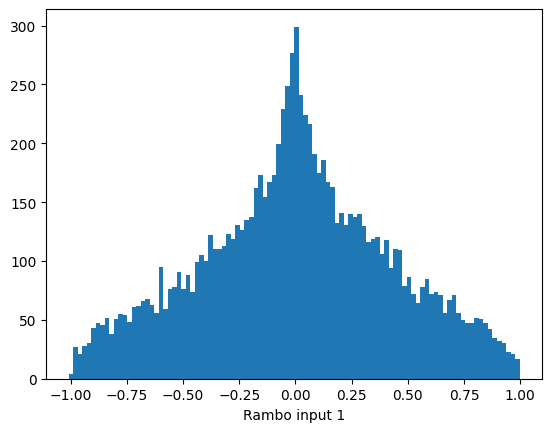

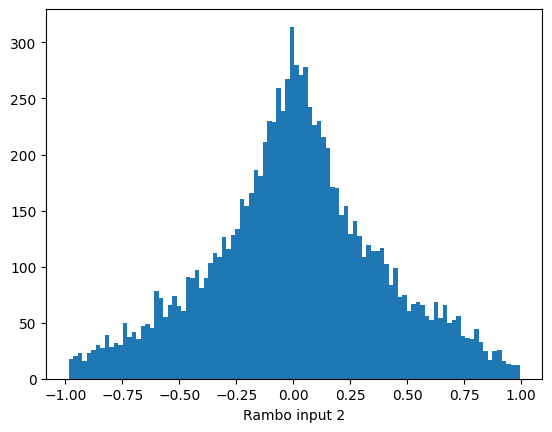

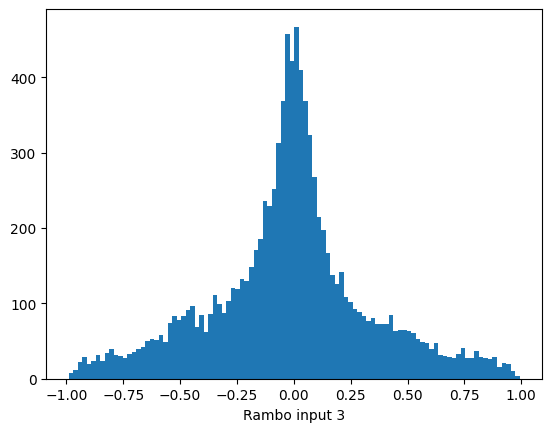

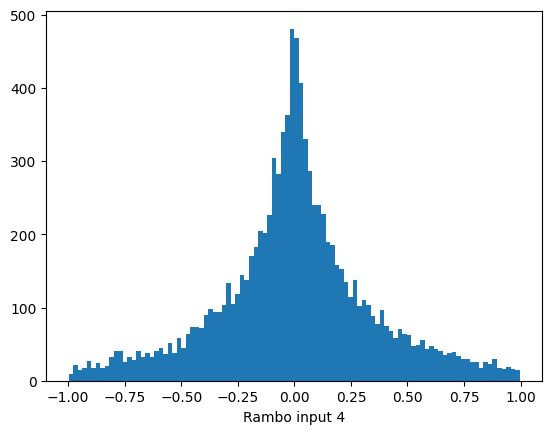

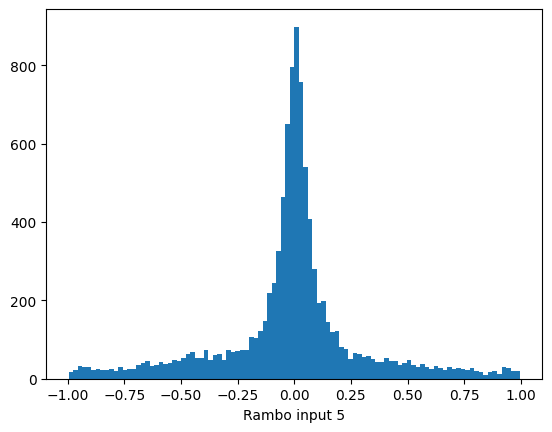

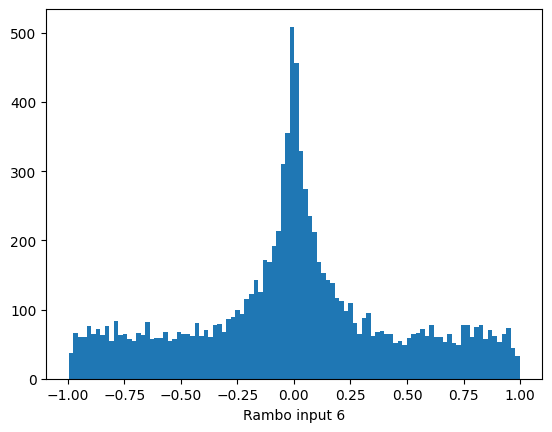

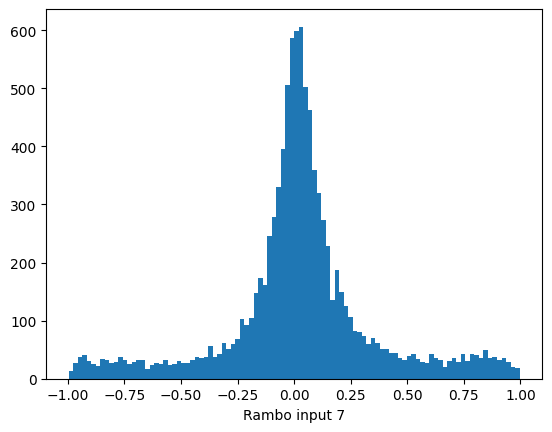

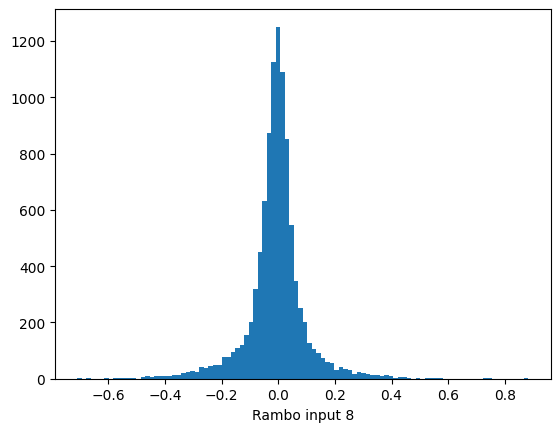

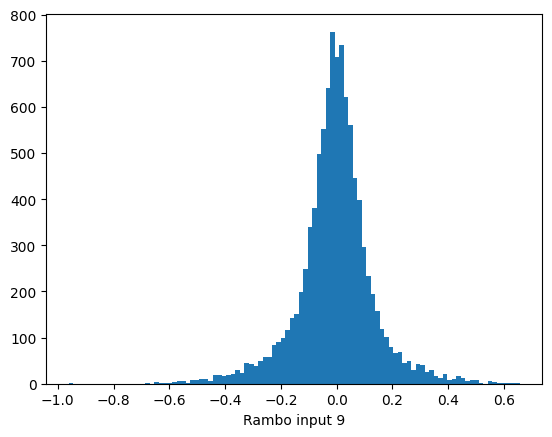

In [68]:
for i in range(10):
    plt.figure()
    plt.hist((PS_target[randomlist,i] - ps_new[:,i]).flatten().numpy(), bins=100);
    plt.xlabel(f"Rambo input {i}")

# 2nd version: many samples for 1 event

In [12]:
Number_events = 1
N_samples = 10000

randomlist = random.sample(range(0, dataCorrect.shape[0]-1), Number_events)

ps_regressed, ps_new, higgs_flow, thad_flow, tlep_flow, ISR_flow = get_particle(data, randomlist, conf, N_samples)
higgs_target, thad_target, tlep_target, ISR_target = get_particle_target(higgsCorrect, thadCorrect,
                                                                         tlepCorrect, glISRCorrect, randomlist)

print('')
#print(ps_regressed)
#print(ps_new[0:5])

#print(PS_target[randomlist])



before model
after model, before sampling: PS_regressed: torch.Size([1, 10])
Case: 1 event, many samples
after sampling: ps_new_shape: torch.Size([10000, 10])



In [13]:
diff = PS_target[randomlist] - ps_new

bias_avg = torch.mean(diff, dim=0)
print(bias_avg.shape)
print(bias_avg)

std = torch.std(diff, dim=0)
print(std.shape)
print(std)

normalized_dist = bias_avg / std
print(normalized_dist)

torch.Size([10])
tensor([-0.3189, -0.4574, -0.0074, -0.2671, -0.5199,  0.0211, -0.2336, -0.2799,
        -0.0096,  0.0182])
torch.Size([10])
tensor([0.2819, 0.2520, 0.1585, 0.3813, 0.2152, 0.2512, 0.2883, 0.1504, 0.0462,
        0.0786])
tensor([-1.1313, -1.8150, -0.0468, -0.7005, -2.4160,  0.0839, -0.8102, -1.8619,
        -0.2078,  0.2316])


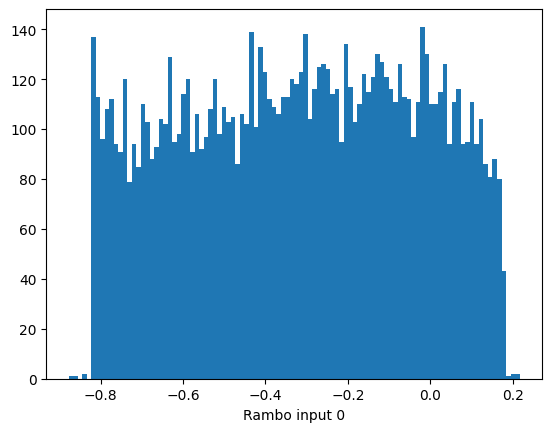

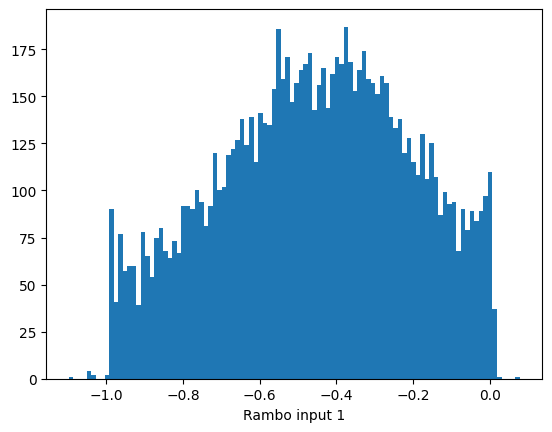

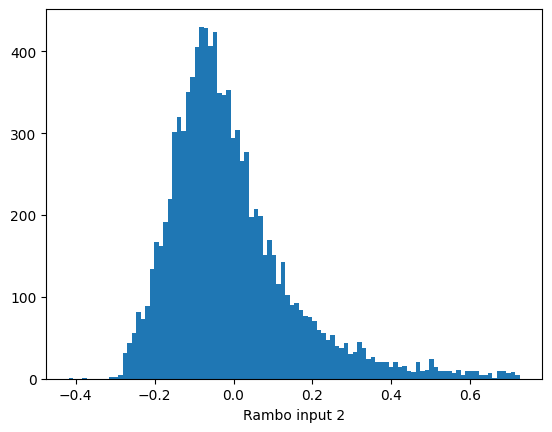

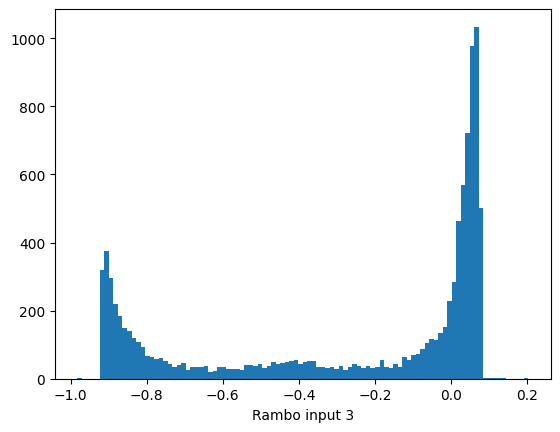

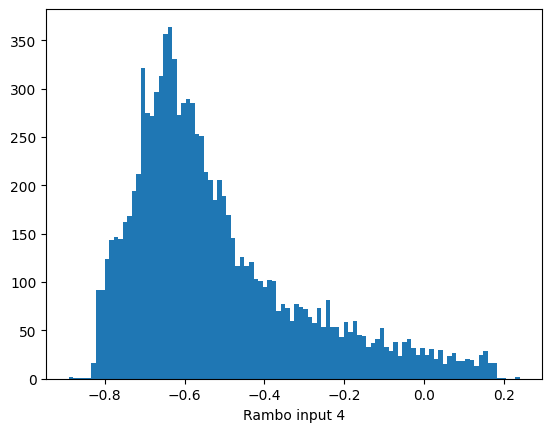

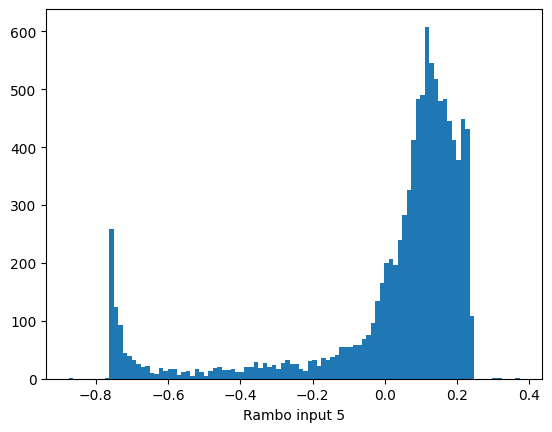

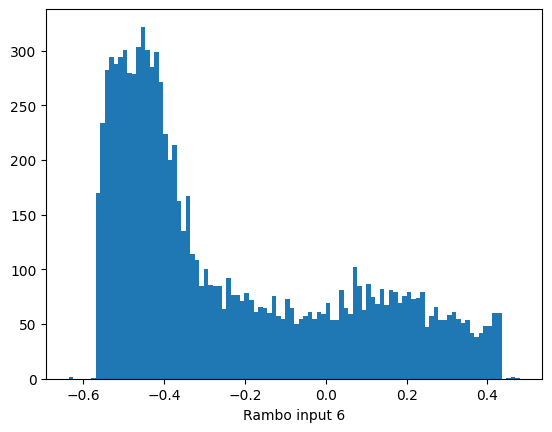

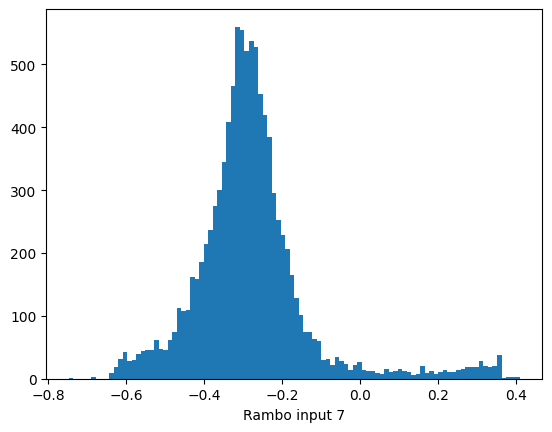

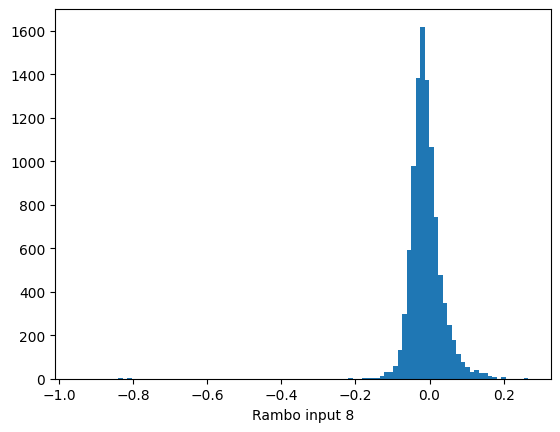

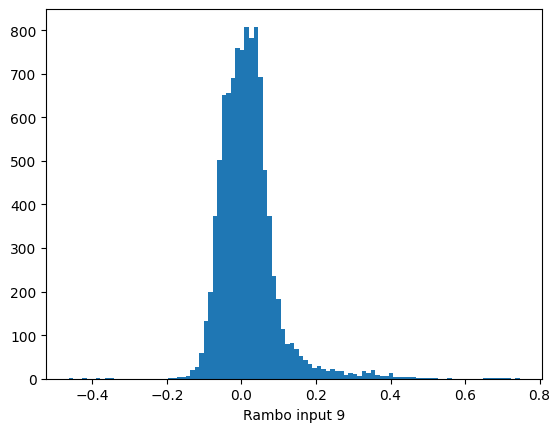

In [14]:
for i in range(10):
    plt.figure()
    plt.hist((PS_target[randomlist,i] - ps_new[:,i]).flatten().numpy(), bins=100);
    plt.xlabel(f"Rambo input {i}")

In [10]:
plot_var2d(higgs_var1=higgs_target.px, higgs_var2=higgs_flow.px,
           thad_var1=thad_target.px, thad_var2=thad_flow.px,
           tlep_var1=tlep_target.px, tlep_var2=tlep_flow.px,
           ISR_var1=ISR_target.px, ISR_var2=ISR_flow.px,
           name1='$eta-correct$', name2='$eta-regressed$', nameFig='29.png', 
           start1=-1000, stop1=1000, start2=-1000, stop2=1000, bins1=100, bins2=100,
           higgs_mask=1, thad_mask=1, tlep_mask=1, ISR_mask=1,
           neg_Mask=False, log=True, name='$\eta$')

IndexError: cannot slice IndexedArray (of length 1) with 1

# Split in matched/unmatched

In [8]:
df = ak.from_parquet(path_data)
jets = df.jets
jets = ak.with_name(jets, name="Momentum4D")

x = FindMasks()
higgs_mask = x.higgs_mask(jets)
thad_mask = x.thad_mask(jets)
tlep_mask = x.tlep_mask(jets)
ISR_mask = x.ISR_mask(jets)

# HIGGS NEW BINNING

In [9]:
plot_regressionFactor(higgs.eta, higgsCorrect.eta, higgsCorrect.eta, matched=higgs_mask,
                      intervalTargetVar=[-4,-3,-2,-1.5,-1,-0.75,-0.5,-0.25,0,0.25,0.5,0.75,1,1.5,2,3,4],
                      limTarget=(-4, 4), bins=8, ylim=[-3,3], xname='$\eta-correct$',
                      yname='$\eta_{regressed} - \eta_{correct}$', eta=True)

plot_regressionFactor(higgs.eta, higgsCorrect.eta, higgsCorrect.pt, matched=higgs_mask,
                      intervalTargetVar=[0,20,40,60,80,100,140,180,220,240,280,300,350,400,600,1000],
                      limTarget=(0, 1000), bins=20, ylim=[-3,3], xname='$p_t-correct$',
                      yname='$\eta_{regressed} - \eta_{correct}$')

plot_regressionFactor(higgs.phi, higgsCorrect.phi, higgsCorrect.eta, matched=higgs_mask,
                      intervalTargetVar=[-4,-3,-2,-1.5,-1,-0.75,-0.5,-0.25,0,0.25,0.5,0.75,1,1.5,2,3,4],
                      limTarget=(-4, 4), bins=8, ylim=[-4,4], xname='$\eta-correct$',
                      yname='$\phi_{regressed} - \phi_{correct}$', eta=True)

plot_regressionFactor(higgs.phi, higgsCorrect.phi, higgsCorrect.pt, matched=higgs_mask,
                      limTarget=(0, 1000), bins=20, ylim=[-4,4], xname='$p_t-correct$',
                      intervalTargetVar=[0,20,40,60,80,100,140,180,220,240,280,300,350,400,600,1000],
                      yname='$\phi_{regressed} - \phi_{correct}$')

plot_regressionFactor(higgs.pt, higgsCorrect.pt, higgsCorrect.eta, matched=higgs_mask,
                      intervalTargetVar=[-4,-3,-2,-1.5,-1,-0.75,-0.5,-0.25,0,0.25,0.5,0.75,1,1.5,2,3,4],
                      limTarget=(-4, 4), bins=8, ylim=[-100,100], xname='$\eta-correct$',
                      yname='$pt_{regressed} - pt_{correct}$', eta=True)

plot_regressionFactor(higgs.pt, higgsCorrect.pt, higgsCorrect.pt, matched=higgs_mask,
                      intervalTargetVar=[0,20,40,60,80,100,140,180,220,240,280,300,350,400,600,1000],
                      limTarget=(0, 1000), bins=20, ylim=[-100,100], xname='$p_t-correct$',
                      yname='$pt_{regressed} - pt_{correct}$')

plot_regressionFactor(higgs.pt, higgsCorrect.pt, higgsCorrect.eta, matched=higgs_mask,
                      intervalTargetVar=[-4,-3,-2,-1.5,-1,-0.75,-0.5,-0.25,0,0.25,0.5,0.75,1,1.5,2,3,4],
                      limTarget=(-4, 4), bins=8, ylim=[-5,5], xname='$\eta-correct$',
                      yname=r'$\frac{pt_{regressed} - pt_{correct}}{pt_{correct}}$', eta=True, ratio=True)

plot_regressionFactor(higgs.pt, higgsCorrect.pt, higgsCorrect.pt, matched=higgs_mask,
                      intervalTargetVar=[0,20,40,60,80,100,140,180,220,240,280,300,350,400,600,1000],
                      limTarget=(0, 1000), bins=20, ylim=[-1.5,1.5], xname='$p_t-correct$',
                      yname=r'$\frac{pt_{regressed} - pt_{correct}}{pt_{correct}}$', ratio=True)

NameError: name 'plot_regressionFactor' is not defined

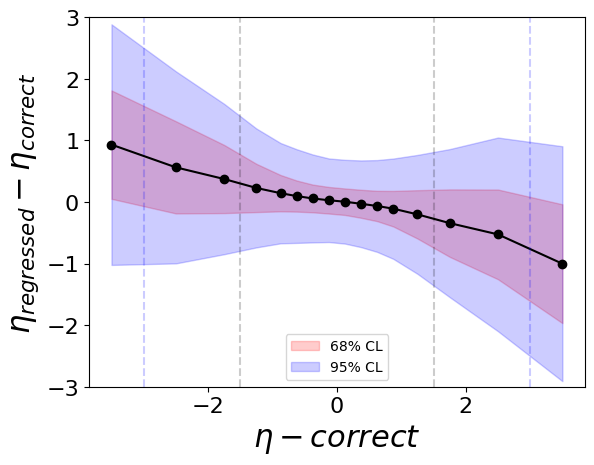

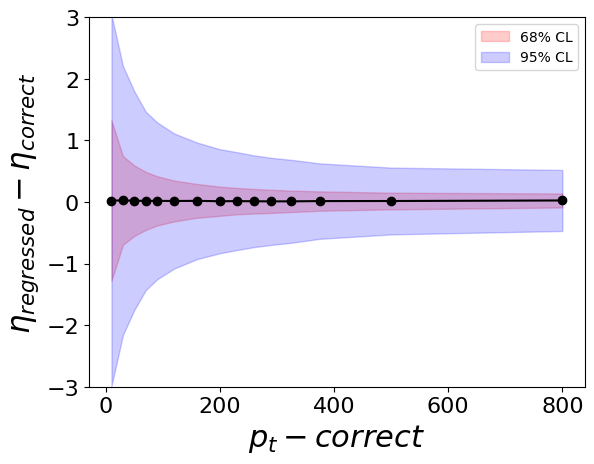

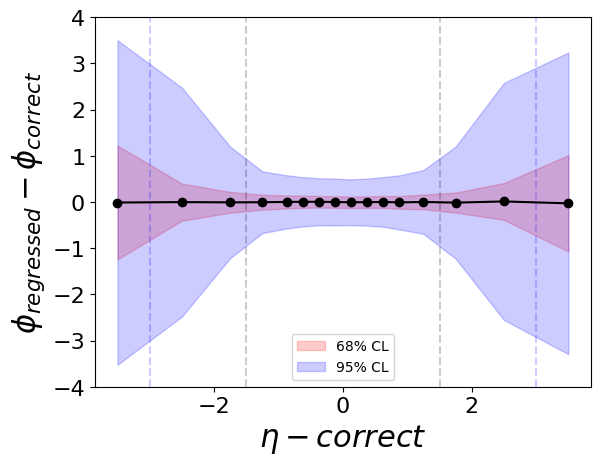

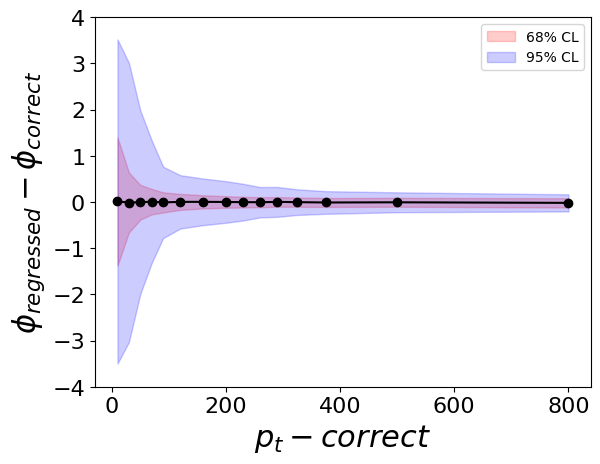

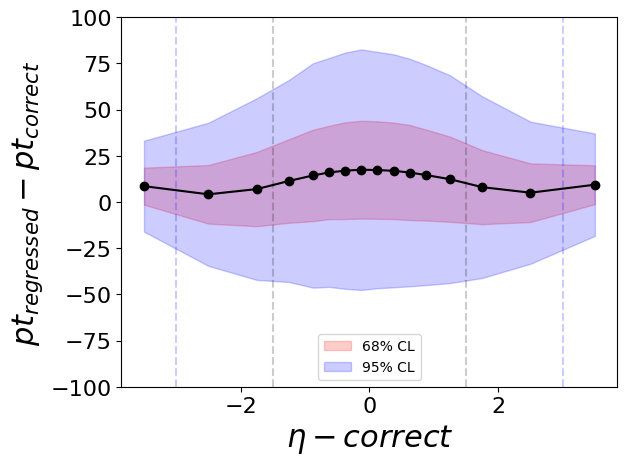

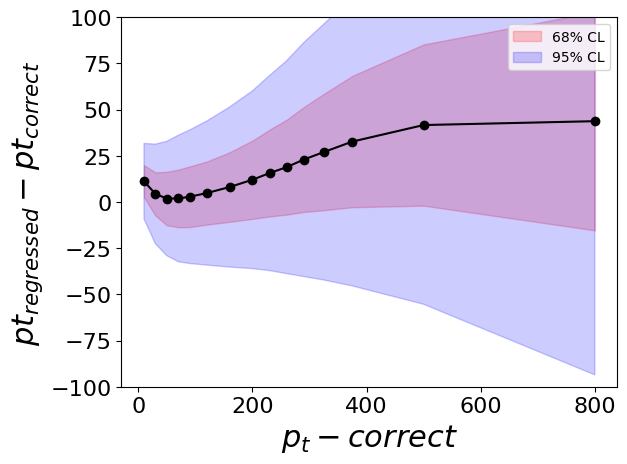

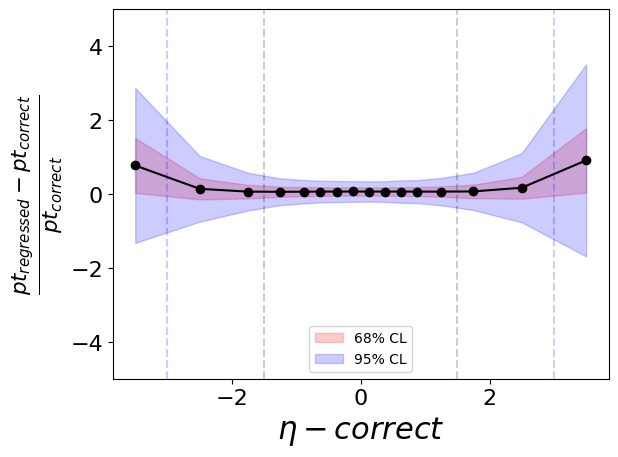

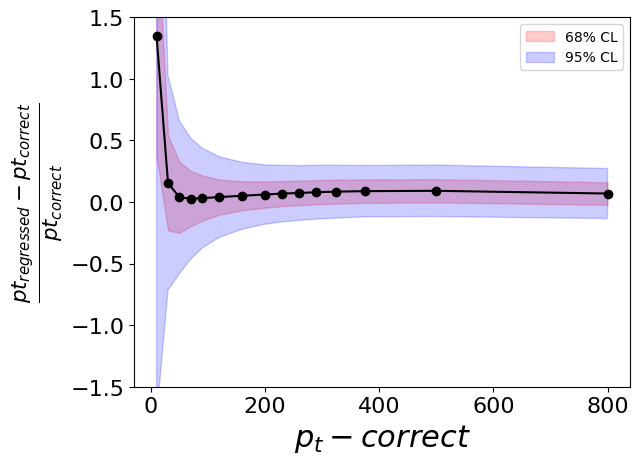

In [33]:
plot_regressionFactor(thad.eta, thadCorrect.eta, thadCorrect.eta, matched=thad_mask,
                      intervalTargetVar=[-4,-3,-2,-1.5,-1,-0.75,-0.5,-0.25,0,0.25,0.5,0.75,1,1.5,2,3,4],
                      limTarget=(-4, 4), bins=8, ylim=[-3,3], xname='$\eta-correct$',
                      yname='$\eta_{regressed} - \eta_{correct}$', eta=True)

plot_regressionFactor(thad.eta, thadCorrect.eta, thadCorrect.pt, matched=thad_mask,
                      intervalTargetVar=[0,20,40,60,80,100,140,180,220,240,280,300,350,400,600,1000],
                      limTarget=(0, 1000), bins=20, ylim=[-3,3], xname='$p_t-correct$',
                      yname='$\eta_{regressed} - \eta_{correct}$')

plot_regressionFactor(thad.phi, thadCorrect.phi, thadCorrect.eta, matched=thad_mask,
                      intervalTargetVar=[-4,-3,-2,-1.5,-1,-0.75,-0.5,-0.25,0,0.25,0.5,0.75,1,1.5,2,3,4],
                      limTarget=(-4, 4), bins=8, ylim=[-4,4], xname='$\eta-correct$',
                      yname='$\phi_{regressed} - \phi_{correct}$', eta=True)

plot_regressionFactor(thad.phi, thadCorrect.phi, thadCorrect.pt, matched=thad_mask,
                      limTarget=(0, 1000), bins=20, ylim=[-4,4], xname='$p_t-correct$',
                      intervalTargetVar=[0,20,40,60,80,100,140,180,220,240,280,300,350,400,600,1000],
                      yname='$\phi_{regressed} - \phi_{correct}$')

plot_regressionFactor(thad.pt, thadCorrect.pt, thadCorrect.eta, matched=thad_mask,
                      intervalTargetVar=[-4,-3,-2,-1.5,-1,-0.75,-0.5,-0.25,0,0.25,0.5,0.75,1,1.5,2,3,4],
                      limTarget=(-4, 4), bins=8, ylim=[-100,100], xname='$\eta-correct$',
                      yname='$pt_{regressed} - pt_{correct}$', eta=True)

plot_regressionFactor(thad.pt, thadCorrect.pt, thadCorrect.pt, matched=thad_mask,
                      intervalTargetVar=[0,20,40,60,80,100,140,180,220,240,280,300,350,400,600,1000],
                      limTarget=(0, 1000), bins=20, ylim=[-100,100], xname='$p_t-correct$',
                      yname='$pt_{regressed} - pt_{correct}$')

plot_regressionFactor(thad.pt, thadCorrect.pt, thadCorrect.eta, matched=thad_mask,
                      intervalTargetVar=[-4,-3,-2,-1.5,-1,-0.75,-0.5,-0.25,0,0.25,0.5,0.75,1,1.5,2,3,4],
                      limTarget=(-4, 4), bins=8, ylim=[-5,5], xname='$\eta-correct$',
                      yname=r'$\frac{pt_{regressed} - pt_{correct}}{pt_{correct}}$', eta=True, ratio=True)

plot_regressionFactor(thad.pt, thadCorrect.pt, thadCorrect.pt, matched=thad_mask,
                      intervalTargetVar=[0,20,40,60,80,100,140,180,220,240,280,300,350,400,600,1000],
                      limTarget=(0, 1000), bins=20, ylim=[-1.5,1.5], xname='$p_t-correct$',
                      yname=r'$\frac{pt_{regressed} - pt_{correct}}{pt_{correct}}$', ratio=True)

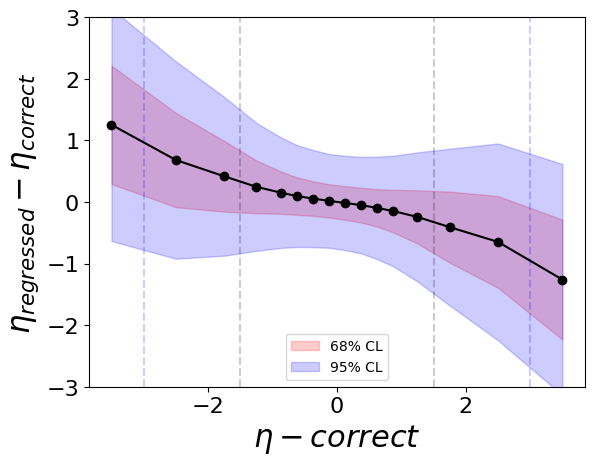

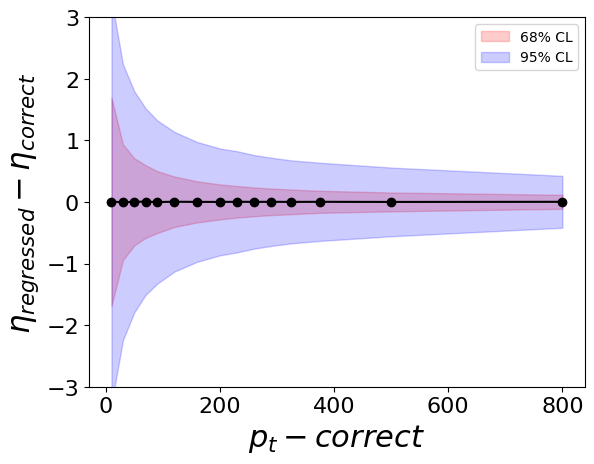

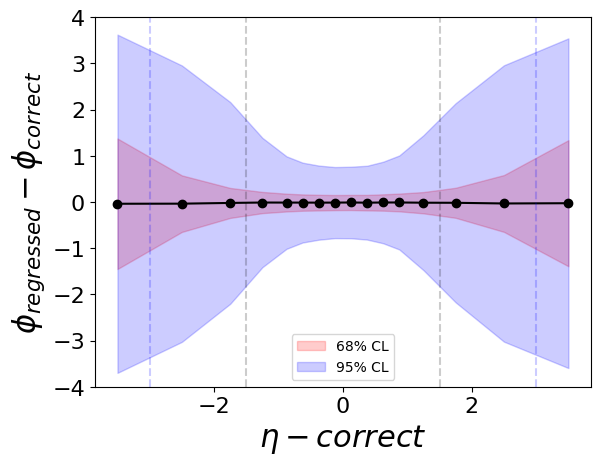

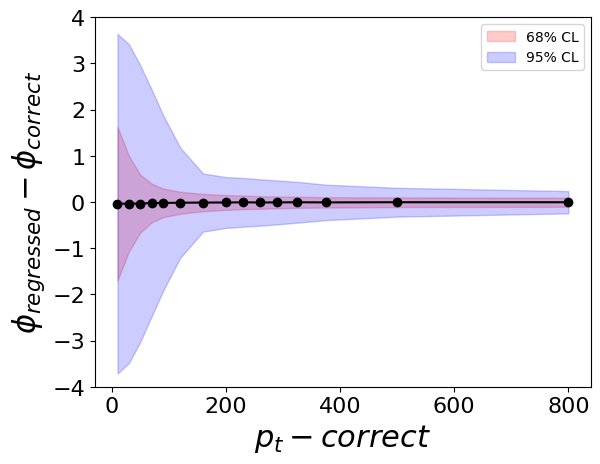

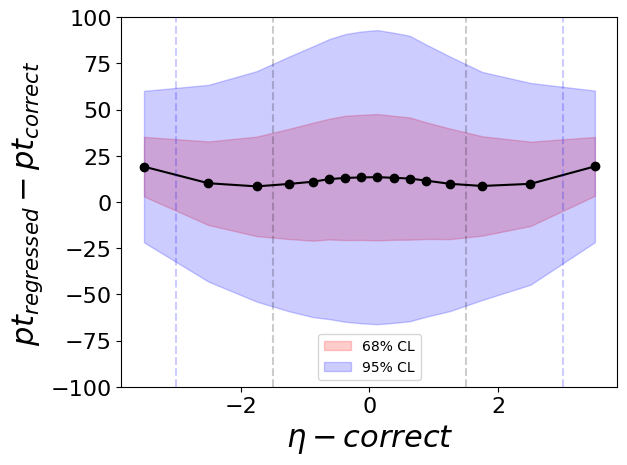

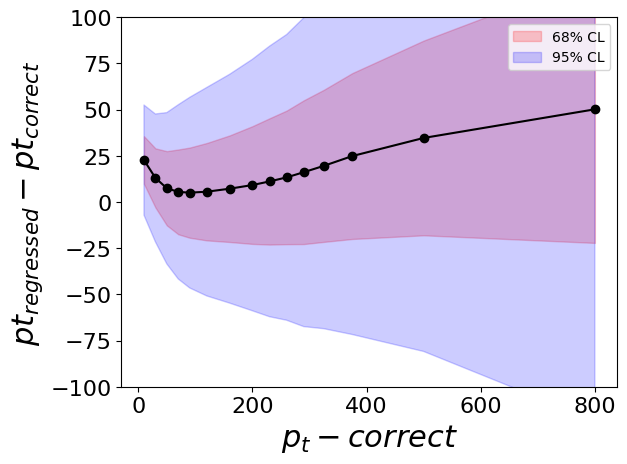

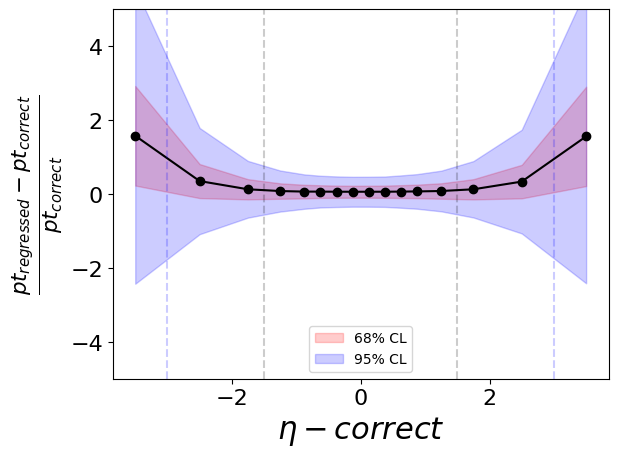

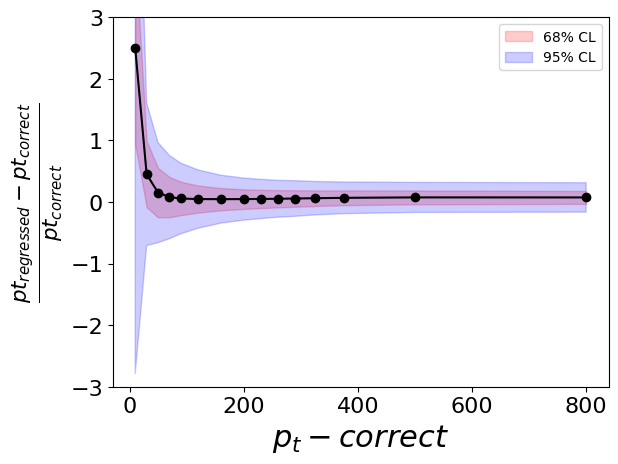

In [34]:
plot_regressionFactor(tlep.eta, tlepCorrect.eta, tlepCorrect.eta, matched=tlep_mask,
                      intervalTargetVar=[-4,-3,-2,-1.5,-1,-0.75,-0.5,-0.25,0,0.25,0.5,0.75,1,1.5,2,3,4],
                      limTarget=(-4, 4), bins=8, ylim=[-3,3], xname='$\eta-correct$',
                      yname='$\eta_{regressed} - \eta_{correct}$', eta=True)

plot_regressionFactor(tlep.eta, tlepCorrect.eta, tlepCorrect.pt, matched=tlep_mask,
                      intervalTargetVar=[0,20,40,60,80,100,140,180,220,240,280,300,350,400,600,1000],
                      limTarget=(0, 1000), bins=20, ylim=[-3,3], xname='$p_t-correct$',
                      yname='$\eta_{regressed} - \eta_{correct}$')

plot_regressionFactor(tlep.phi, tlepCorrect.phi, tlepCorrect.eta, matched=tlep_mask,
                      intervalTargetVar=[-4,-3,-2,-1.5,-1,-0.75,-0.5,-0.25,0,0.25,0.5,0.75,1,1.5,2,3,4],
                      limTarget=(-4, 4), bins=8, ylim=[-4,4], xname='$\eta-correct$',
                      yname='$\phi_{regressed} - \phi_{correct}$', eta=True)

plot_regressionFactor(tlep.phi, tlepCorrect.phi, tlepCorrect.pt, matched=tlep_mask,
                      limTarget=(0, 1000), bins=20, ylim=[-4,4], xname='$p_t-correct$',
                      intervalTargetVar=[0,20,40,60,80,100,140,180,220,240,280,300,350,400,600,1000],
                      yname='$\phi_{regressed} - \phi_{correct}$')

plot_regressionFactor(tlep.pt, tlepCorrect.pt, tlepCorrect.eta, matched=tlep_mask,
                      intervalTargetVar=[-4,-3,-2,-1.5,-1,-0.75,-0.5,-0.25,0,0.25,0.5,0.75,1,1.5,2,3,4],
                      limTarget=(-4, 4), bins=8, ylim=[-100,100], xname='$\eta-correct$',
                      yname='$pt_{regressed} - pt_{correct}$', eta=True)

plot_regressionFactor(tlep.pt, tlepCorrect.pt, tlepCorrect.pt, matched=tlep_mask,
                      intervalTargetVar=[0,20,40,60,80,100,140,180,220,240,280,300,350,400,600,1000],
                      limTarget=(0, 1000), bins=20, ylim=[-100,100], xname='$p_t-correct$',
                      yname='$pt_{regressed} - pt_{correct}$')

plot_regressionFactor(tlep.pt, tlepCorrect.pt, tlepCorrect.eta, matched=tlep_mask,
                      intervalTargetVar=[-4,-3,-2,-1.5,-1,-0.75,-0.5,-0.25,0,0.25,0.5,0.75,1,1.5,2,3,4],
                      limTarget=(-4, 4), bins=8, ylim=[-5,5], xname='$\eta-correct$',
                      yname=r'$\frac{pt_{regressed} - pt_{correct}}{pt_{correct}}$', eta=True, ratio=True)

plot_regressionFactor(tlep.pt, tlepCorrect.pt, tlepCorrect.pt, matched=tlep_mask,
                      intervalTargetVar=[0,20,40,60,80,100,140,180,220,240,280,300,350,400,600,1000],
                      limTarget=(0, 1000), bins=20, ylim=[-3,3], xname='$p_t-correct$',
                      yname=r'$\frac{pt_{regressed} - pt_{correct}}{pt_{correct}}$', ratio=True)

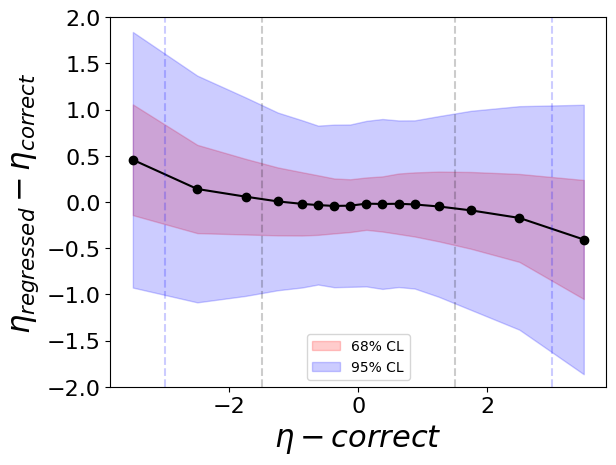

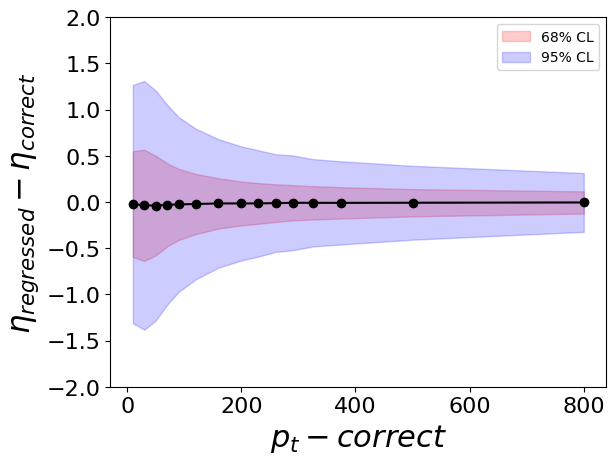

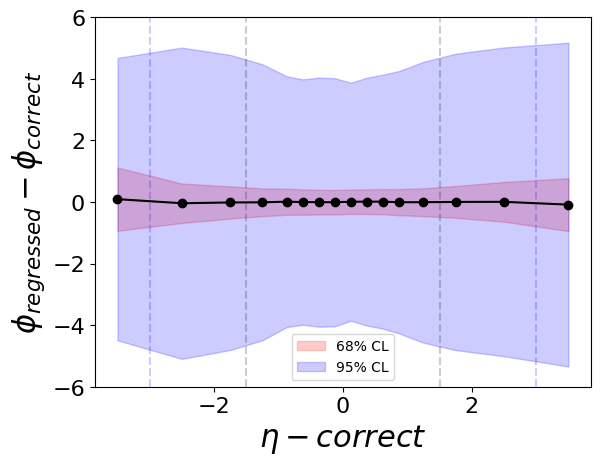

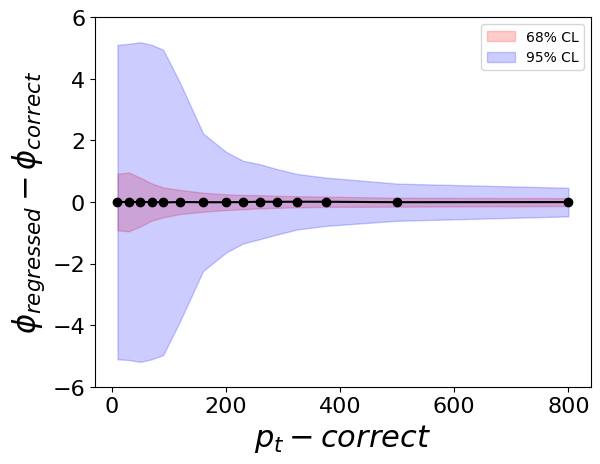

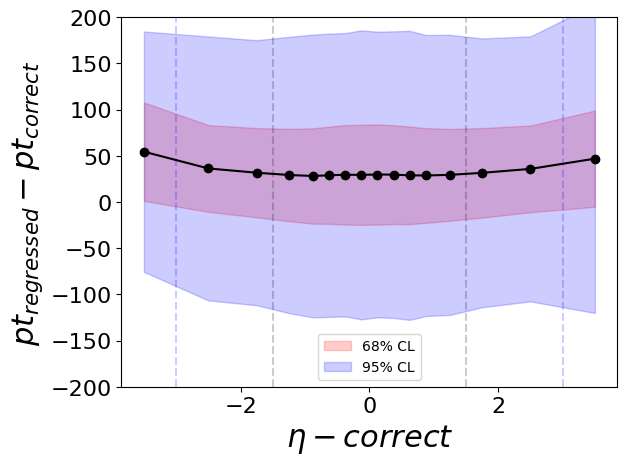

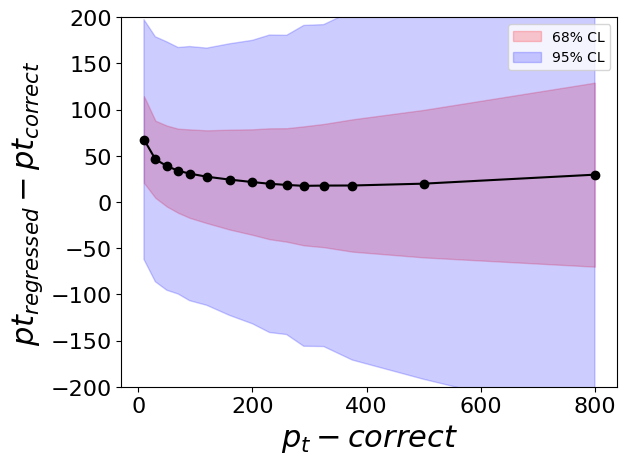

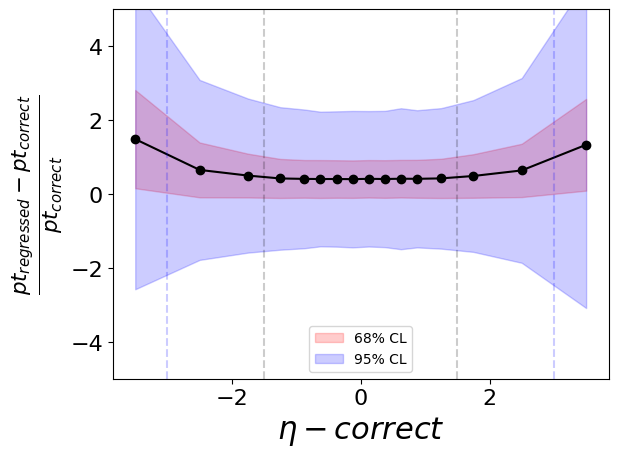

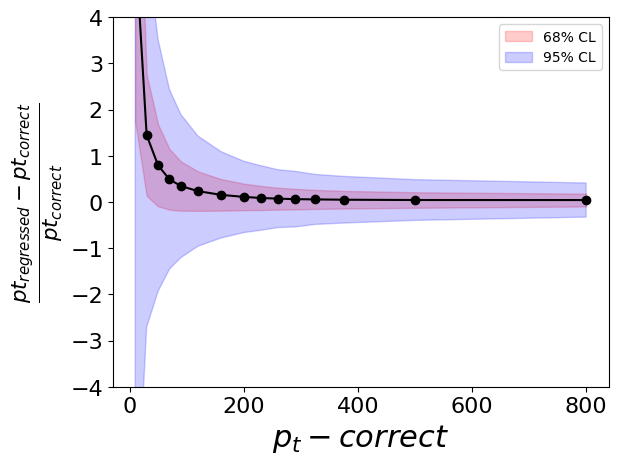

In [35]:
plot_regressionFactor(glISR.eta, glISRCorrect.eta, glISRCorrect.eta, matched=ISR_mask,
                      intervalTargetVar=[-4,-3,-2,-1.5,-1,-0.75,-0.5,-0.25,0,0.25,0.5,0.75,1,1.5,2,3,4],
                      limTarget=(-4, 4), bins=8, ylim=[-2,2], xname='$\eta-correct$',
                      yname='$\eta_{regressed} - \eta_{correct}$', eta=True)

plot_regressionFactor(glISR.eta, glISRCorrect.eta, glISRCorrect.pt, matched=ISR_mask,
                      intervalTargetVar=[0,20,40,60,80,100,140,180,220,240,280,300,350,400,600,1000],
                      limTarget=(0, 1000), bins=20, ylim=[-2,2], xname='$p_t-correct$',
                      yname='$\eta_{regressed} - \eta_{correct}$')

plot_regressionFactor(glISR.phi, glISRCorrect.phi, glISRCorrect.eta, matched=ISR_mask,
                      intervalTargetVar=[-4,-3,-2,-1.5,-1,-0.75,-0.5,-0.25,0,0.25,0.5,0.75,1,1.5,2,3,4],
                      limTarget=(-4, 4), bins=8, ylim=[-6,6], xname='$\eta-correct$',
                      yname='$\phi_{regressed} - \phi_{correct}$', eta=True)

plot_regressionFactor(glISR.phi, glISRCorrect.phi, glISRCorrect.pt, matched=ISR_mask,
                      limTarget=(0, 1000), bins=20, ylim=[-6,6], xname='$p_t-correct$',
                      intervalTargetVar=[0,20,40,60,80,100,140,180,220,240,280,300,350,400,600,1000],
                      yname='$\phi_{regressed} - \phi_{correct}$')

plot_regressionFactor(glISR.pt, glISRCorrect.pt, glISRCorrect.eta, matched=ISR_mask,
                      intervalTargetVar=[-4,-3,-2,-1.5,-1,-0.75,-0.5,-0.25,0,0.25,0.5,0.75,1,1.5,2,3,4],
                      limTarget=(-4, 4), bins=8, ylim=[-200,200], xname='$\eta-correct$',
                      yname='$pt_{regressed} - pt_{correct}$', eta=True)

plot_regressionFactor(glISR.pt, glISRCorrect.pt, glISRCorrect.pt, matched=ISR_mask,
                      intervalTargetVar=[0,20,40,60,80,100,140,180,220,240,280,300,350,400,600,1000],
                      limTarget=(0, 1000), bins=20, ylim=[-200,200], xname='$p_t-correct$',
                      yname='$pt_{regressed} - pt_{correct}$')

plot_regressionFactor(glISR.pt, glISRCorrect.pt, glISRCorrect.eta, matched=ISR_mask,
                      intervalTargetVar=[-4,-3,-2,-1.5,-1,-0.75,-0.5,-0.25,0,0.25,0.5,0.75,1,1.5,2,3,4],
                      limTarget=(-4, 4), bins=8, ylim=[-5,5], xname='$\eta-correct$',
                      yname=r'$\frac{pt_{regressed} - pt_{correct}}{pt_{correct}}$', eta=True, ratio=True)

plot_regressionFactor(glISR.pt, glISRCorrect.pt, glISRCorrect.pt, matched=ISR_mask,
                      intervalTargetVar=[0,20,40,60,80,100,140,180,220,240,280,300,350,400,600,1000],
                      limTarget=(0, 1000), bins=20, ylim=[-4,4], xname='$p_t-correct$',
                      yname=r'$\frac{pt_{regressed} - pt_{correct}}{pt_{correct}}$', ratio=True)

# Check higgs as sum of 2 b jets

In [37]:
jets, partons_matched, partons, generator_info, lepton_partons, lepton_reco,  met, higgs = ak.unzip(ak.from_parquet("../../dataset/v7/all_jets_fullRun2_v1.parquet"))
higgs_jets =  ak.with_name(jets[jets.prov==1], name= "Momentum4D")
higgs_jets = higgs_jets[ak.num(higgs_jets)==2]
H = higgs_jets[:,0]+higgs_jets[:,1]
higgs_parton = ak.with_name(partons[partons.prov==1], name="Momentum4D")
Hparton = (higgs_parton[:, 0] + higgs_parton[:, 1])[ak.num(higgs_jets)==2]
masked = np.ones(ak.to_numpy(Hparton).shape)
masked = np.array(masked, dtype='bool')


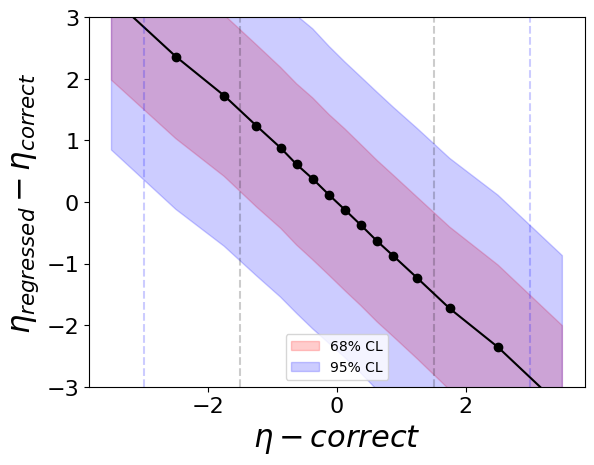

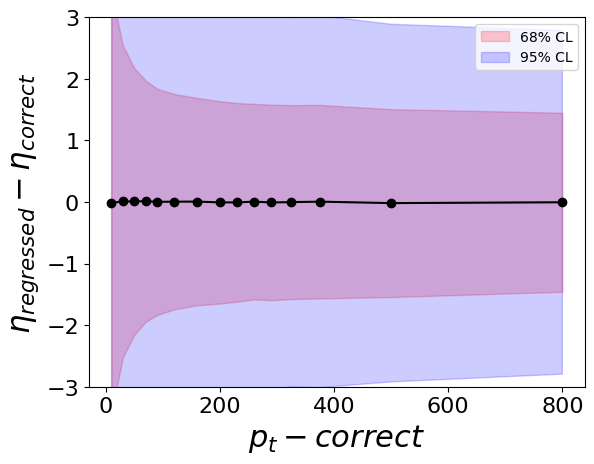

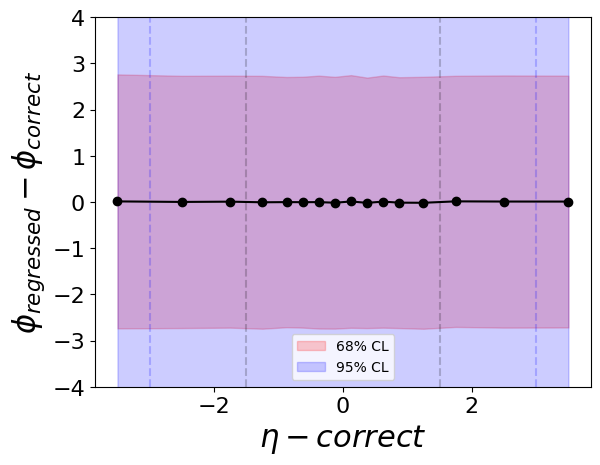

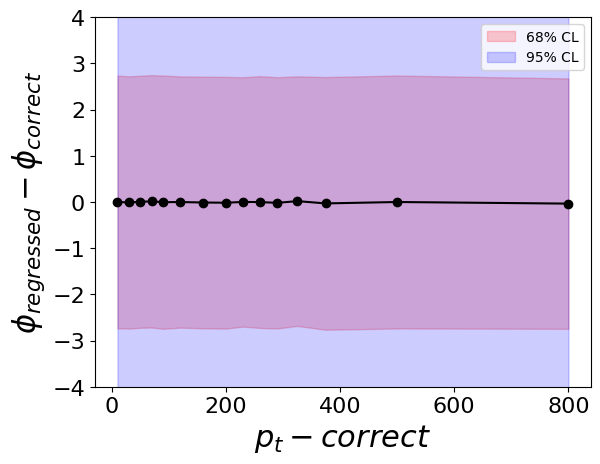

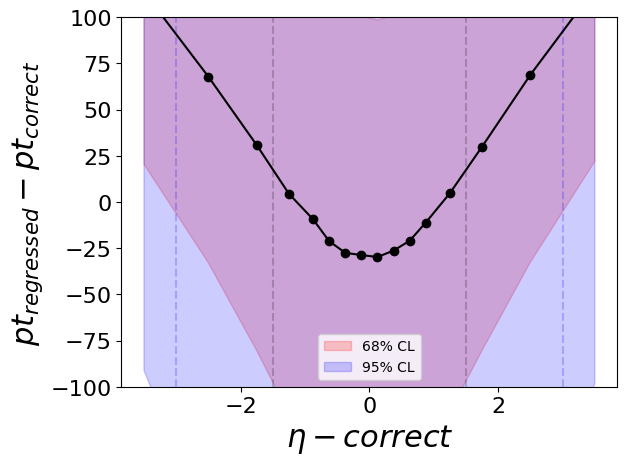

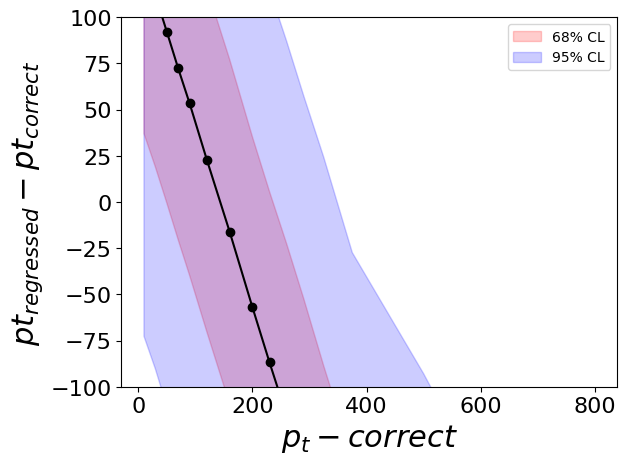

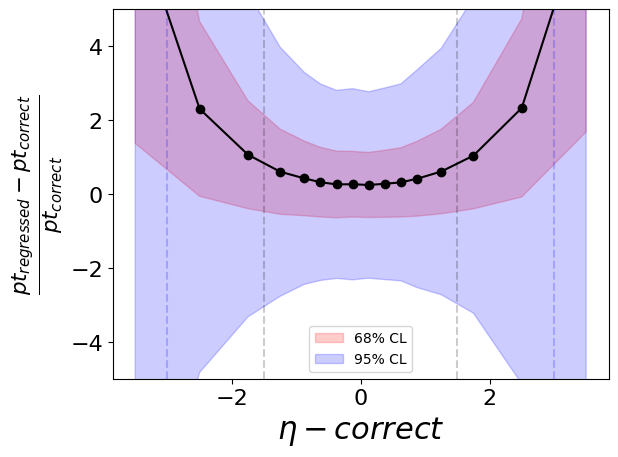

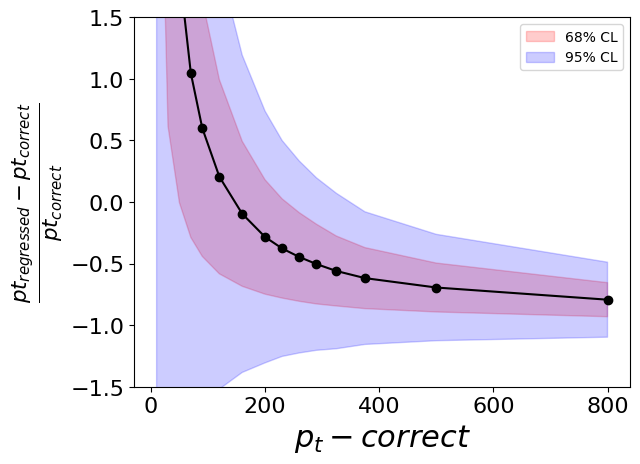

In [38]:
plot_regressionFactor(H.eta, Hparton.eta, Hparton.eta, matched=masked,
                      intervalTargetVar=[-4,-3,-2,-1.5,-1,-0.75,-0.5,-0.25,0,0.25,0.5,0.75,1,1.5,2,3,4],
                      limTarget=(-4, 4), bins=8, ylim=[-3,3], xname='$\eta-correct$',
                      yname='$\eta_{regressed} - \eta_{correct}$', eta=True)

plot_regressionFactor(H.eta, Hparton.eta, Hparton.pt, matched=masked,
                      intervalTargetVar=[0,20,40,60,80,100,140,180,220,240,280,300,350,400,600,1000],
                      limTarget=(0, 1000), bins=20, ylim=[-3,3], xname='$p_t-correct$',
                      yname='$\eta_{regressed} - \eta_{correct}$')

plot_regressionFactor(H.phi, Hparton.phi, Hparton.eta, matched=masked,
                      intervalTargetVar=[-4,-3,-2,-1.5,-1,-0.75,-0.5,-0.25,0,0.25,0.5,0.75,1,1.5,2,3,4],
                      limTarget=(-4, 4), bins=8, ylim=[-4,4], xname='$\eta-correct$',
                      yname='$\phi_{regressed} - \phi_{correct}$', eta=True)

plot_regressionFactor(H.phi, Hparton.phi, Hparton.pt, matched=masked,
                      limTarget=(0, 1000), bins=20, ylim=[-4,4], xname='$p_t-correct$',
                      intervalTargetVar=[0,20,40,60,80,100,140,180,220,240,280,300,350,400,600,1000],
                      yname='$\phi_{regressed} - \phi_{correct}$')

plot_regressionFactor(H.pt, Hparton.pt, Hparton.eta, matched=masked,
                      intervalTargetVar=[-4,-3,-2,-1.5,-1,-0.75,-0.5,-0.25,0,0.25,0.5,0.75,1,1.5,2,3,4],
                      limTarget=(-4, 4), bins=8, ylim=[-100,100], xname='$\eta-correct$',
                      yname='$pt_{regressed} - pt_{correct}$', eta=True)

plot_regressionFactor(H.pt, Hparton.pt, Hparton.pt, matched=masked,
                      intervalTargetVar=[0,20,40,60,80,100,140,180,220,240,280,300,350,400,600,1000],
                      limTarget=(0, 1000), bins=20, ylim=[-100,100], xname='$p_t-correct$',
                      yname='$pt_{regressed} - pt_{correct}$')

plot_regressionFactor(H.pt, Hparton.pt, Hparton.eta, matched=masked,
                      intervalTargetVar=[-4,-3,-2,-1.5,-1,-0.75,-0.5,-0.25,0,0.25,0.5,0.75,1,1.5,2,3,4],
                      limTarget=(-4, 4), bins=8, ylim=[-5,5], xname='$\eta-correct$',
                      yname=r'$\frac{pt_{regressed} - pt_{correct}}{pt_{correct}}$', eta=True, ratio=True)

plot_regressionFactor(H.pt, Hparton.pt, Hparton.pt, matched=masked,
                      intervalTargetVar=[0,20,40,60,80,100,140,180,220,240,280,300,350,400,600,1000],
                      limTarget=(0, 1000), bins=20, ylim=[-1.5,1.5], xname='$p_t-correct$',
                      yname=r'$\frac{pt_{regressed} - pt_{correct}}{pt_{correct}}$', ratio=True)

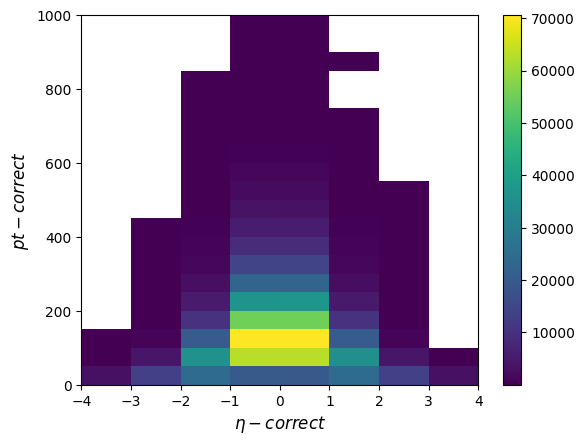

In [19]:
colormap='viridis'
my_viridis = mpl.colormaps[colormap].with_extremes(under="white")

fontsize = 12
labelsize = 10

plt.hist2d(np.array(higgsCorrect.eta[higgs_mask]), np.array(higgsCorrect.pt[higgs_mask]),
           bins=(8, 20), range=((-4,4),(0,1000)),
           cmap=my_viridis, vmin=1) 
plt.xlabel('$\eta-correct$', fontsize=fontsize)
plt.ylabel('$pt-correct$', fontsize=fontsize)
plt.colorbar()
plt.show()

In [165]:
def plot_var2d(higgs_var1, higgs_var2, thad_var1, thad_var2, tlep_var1, tlep_var2,
             ISR_var1, ISR_var2, name1, name2, nameFig, start1=0, stop1=1000, start2=0, stop2=1000, bins1=100, bins2=100,
             higgs_mask=1, thad_mask=1, tlep_mask=1, ISR_mask=1, neg_Mask=False, log=False, name='da', nameunit=''):
        
        
        if neg_Mask:
            higgs_mask = np.logical_not(higgs_mask)
            thad_mask = np.logical_not(thad_mask)
            tlep_mask = np.logical_not(tlep_mask)
            ISR_mask = np.logical_not(ISR_mask)

        # Quick construction, no other imports needed:
        hist2d_var_higgs = (
          Hist.new
          .Reg(bins=bins1, start=start1, stop=stop1, name=name1, label=name1)
          .Reg(bins=bins2, start=start2, stop=stop2, name=name2, label=name2)
          .Double())

        hist2d_var_thad = (
          Hist.new
          .Reg(bins=bins1, start=start1, stop=stop1, name=name1, label=name1)
          .Reg(bins=bins2, start=start2, stop=stop2, name=name2, label=name2)
          .Double())

        hist2d_var_tlep = (
          Hist.new
          .Reg(bins=bins1, start=start1, stop=stop1, name=name1, label=name1)
          .Reg(bins=bins2, start=start2, stop=stop2, name=name2, label=name2)
          .Double())

        hist2d_var_ISR = (
          Hist.new
          .Reg(bins=bins1, start=start1, stop=stop1, name=name1, label=name1)
          .Reg(bins=bins2, start=start2, stop=stop2, name=name2, label=name2)
          .Double())

        hist2d_var_higgs.fill(higgs_var1[higgs_mask],
                            higgs_var2[higgs_mask])

        hist2d_var_thad.fill(thad_var1[thad_mask],
                            thad_var2[thad_mask])

        hist2d_var_tlep.fill(tlep_var1[tlep_mask],
                            tlep_var2[tlep_mask])

        hist2d_var_ISR.fill(ISR_var1[ISR_mask],
                            ISR_var2[ISR_mask])

        colormap='viridis'
        my_viridis = mpl.colormaps[colormap].with_extremes(under="white")
        
        fontsize = 20
        labelsize=14
        labels = ['higgs', 'thad', 'tlep', 'ISR']
        hist2d_list = [hist2d_var_higgs, hist2d_var_thad, hist2d_var_tlep, hist2d_var_ISR]
        
        
        fig, axs = plt.subplots(1, 4, figsize=(16, 6))

        if log:
            for i in range(4):
                w, x, y = hist2d_list[i].to_numpy()
                mesh = axs[i].pcolormesh(x, y, w.T, cmap=my_viridis, norm=mpl.colors.LogNorm(vmin=1))
                axs[i].set_xlabel(f"{name}-correct {nameunit}", fontsize=fontsize)
                axs[i].set_ylabel(f"{name}-regressed {nameunit}", fontsize=fontsize)
                axs[i].set_title(f"{labels[i]}", fontsize=fontsize)
                axs[i].tick_params(axis='both', which='major', labelsize=labelsize)
                cbar = fig.colorbar(mesh)
                cbar.ax.tick_params(labelsize=labelsize)
                plt.tight_layout()

        else:
            for i in range(4):
                w, x, y = hist2d_list[i].to_numpy()
                mesh = axs[i].pcolormesh(x, y, w.T, cmap=my_viridis, vmin=1)
                axs[i].set_xlabel(f"{name}-correct {nameunit}", fontsize=fontsize)
                axs[i].set_ylabel(f"{name}-regressed {nameunit}", fontsize=fontsize)
                axs[i].set_title(f"{labels[i]}", fontsize=fontsize)
                axs[i].tick_params(axis='both', which='major', labelsize=labelsize)
                cbar = fig.colorbar(mesh)
                cbar.ax.tick_params(labelsize=labelsize)
                plt.tight_layout()

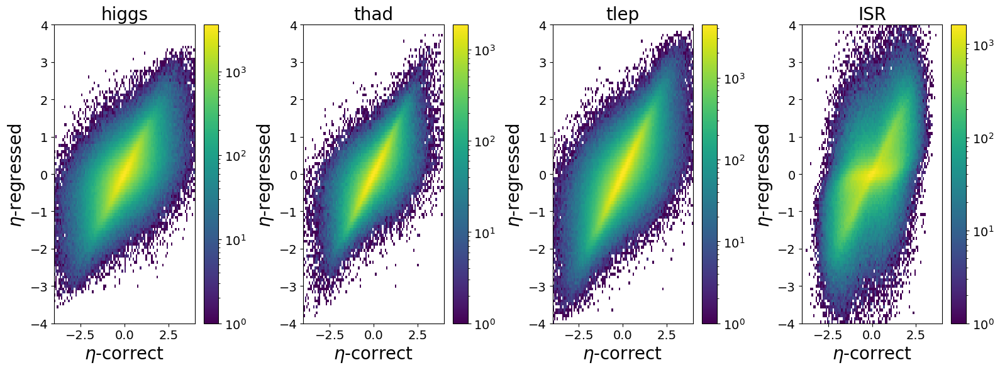

In [10]:
plot_var2d(higgs_var1=higgsCorrect.eta, higgs_var2=higgs.eta,
           thad_var1=thadCorrect.eta, thad_var2=thad.eta,
           tlep_var1=tlepCorrect.eta, tlep_var2=tlep.eta,
           ISR_var1=glISRCorrect.eta, ISR_var2=glISR.eta,
           name1='$eta-correct$', name2='$eta-regressed$', nameFig='29.png', 
           start1=-4, stop1=4, start2=-4, stop2=4, bins1=100, bins2=100,
           higgs_mask=higgs_mask, thad_mask=thad_mask, tlep_mask=tlep_mask, ISR_mask=ISR_mask,
           neg_Mask=False, log=True, name='$\eta$')

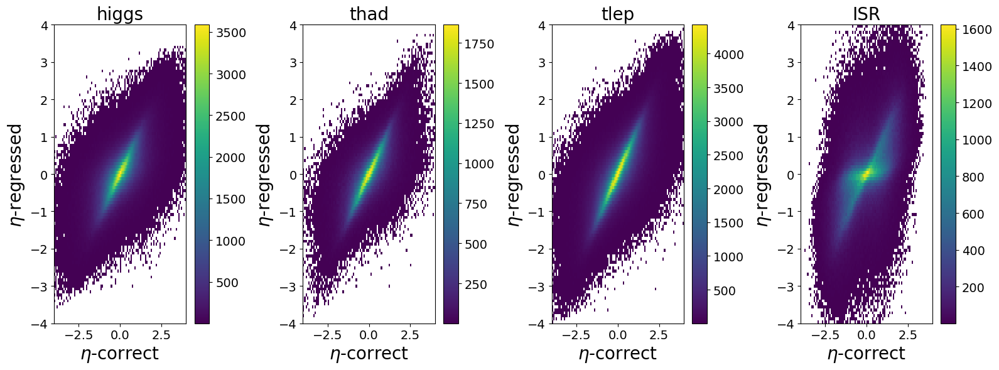

In [11]:
plot_var2d(higgs_var1=higgsCorrect.eta, higgs_var2=higgs.eta,
           thad_var1=thadCorrect.eta, thad_var2=thad.eta,
           tlep_var1=tlepCorrect.eta, tlep_var2=tlep.eta,
           ISR_var1=glISRCorrect.eta, ISR_var2=glISR.eta,
           name1='$eta-correct$', name2='$eta-regressed$', nameFig='29.png', 
           start1=-4, stop1=4, start2=-4, stop2=4, bins1=100, bins2=100,
           higgs_mask=higgs_mask, thad_mask=thad_mask, tlep_mask=tlep_mask, ISR_mask=ISR_mask,
           neg_Mask=False, log=False, name='$\eta$')

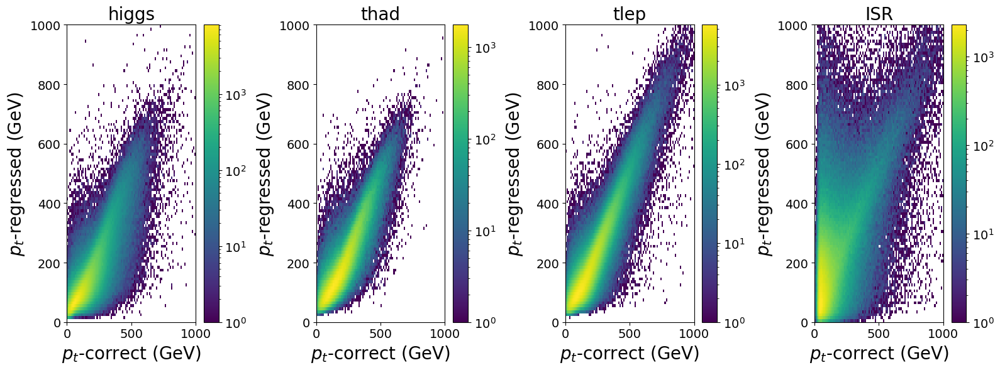

In [12]:
plot_var2d(higgs_var1=higgsCorrect.pt, higgs_var2=higgs.pt,
           thad_var1=thadCorrect.pt, thad_var2=thad.pt,
           tlep_var1=tlepCorrect.pt, tlep_var2=tlep.pt,
           ISR_var1=glISRCorrect.pt, ISR_var2=glISR.pt,
           name1='$eta-correct$', name2='$eta-regressed$', nameFig='29.png', 
           start1=0, stop1=1000, start2=0, stop2=1000, bins1=100, bins2=100,
           higgs_mask=higgs_mask, thad_mask=thad_mask, tlep_mask=tlep_mask, ISR_mask=ISR_mask,
           neg_Mask=False, log=True, name='$p_t$', nameunit='(GeV)')

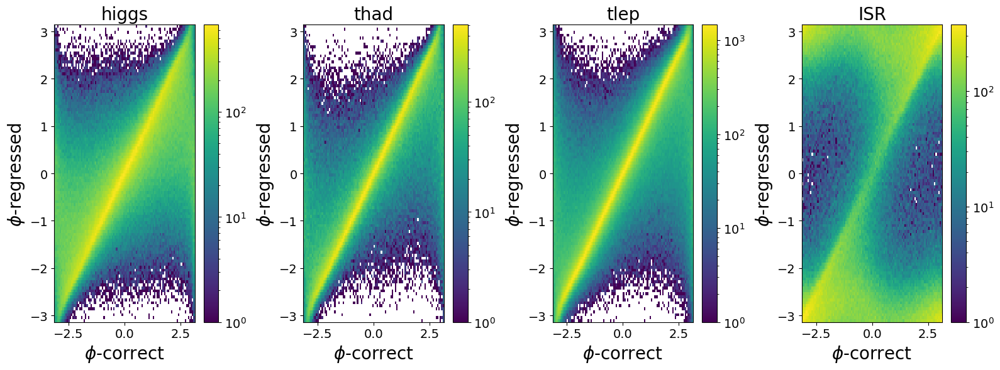

In [13]:
plot_var2d(higgs_var1=higgsCorrect.phi, higgs_var2=higgs.phi,
           thad_var1=thadCorrect.phi, thad_var2=thad.phi,
           tlep_var1=tlepCorrect.phi, tlep_var2=tlep.phi,
           ISR_var1=glISRCorrect.phi, ISR_var2=glISR.phi,
           name1='$eta-correct$', name2='$eta-regressed$', nameFig='29.png', 
           start1=-pi, stop1=pi, start2=-pi, stop2=pi, bins1=100, bins2=100,
           higgs_mask=higgs_mask, thad_mask=thad_mask, tlep_mask=tlep_mask, ISR_mask=ISR_mask,
           neg_Mask=False, log=True, name='$\phi$')

# Plots (higgsCorrect/thadCorrect/... higgs/thad ...)


In [14]:
plots = SavePlots('plots/try6')

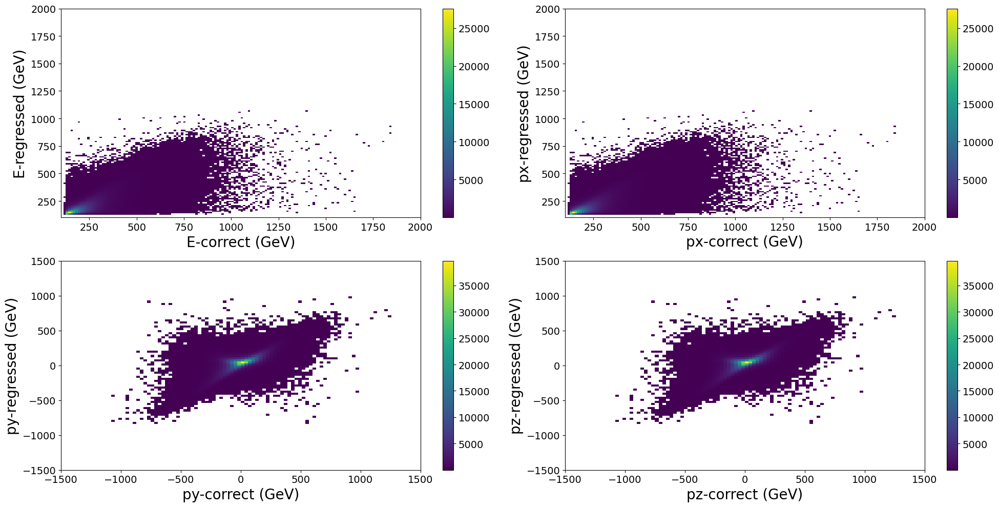

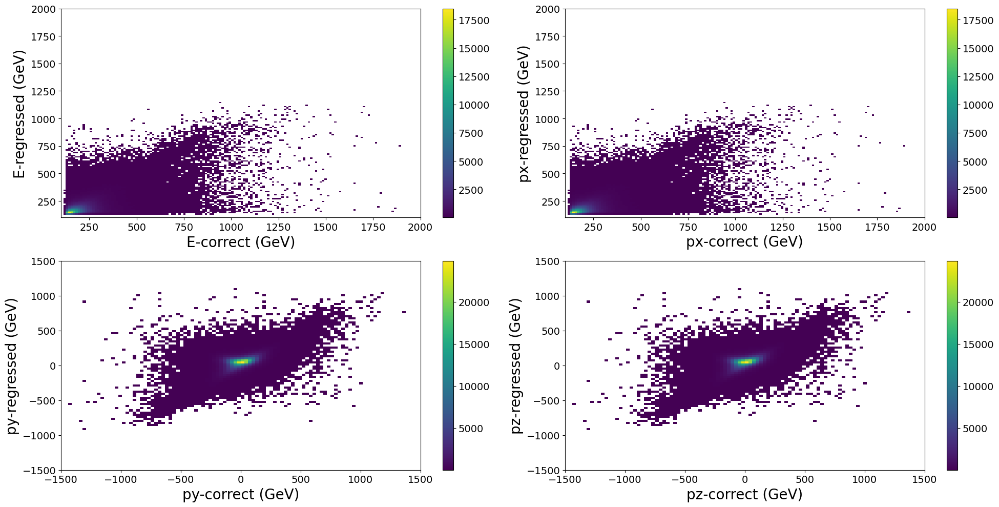

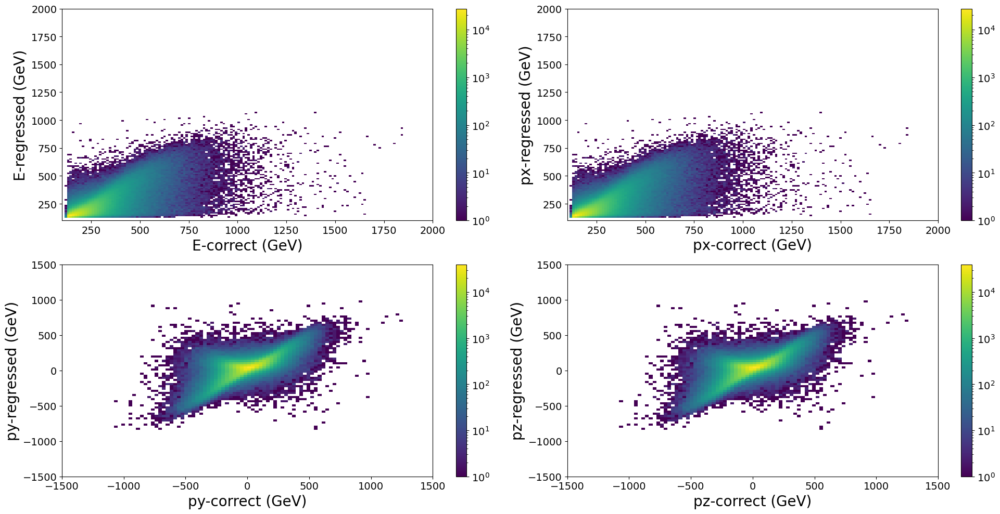

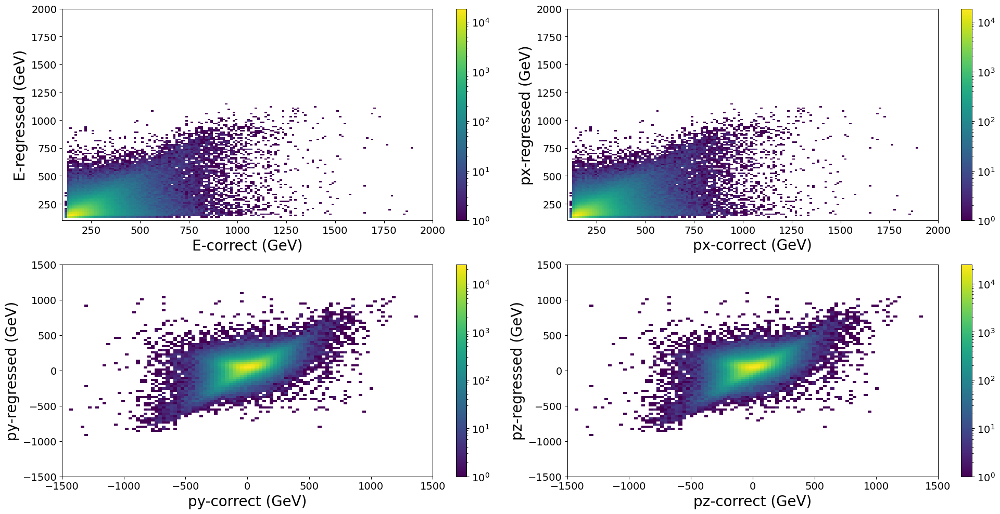

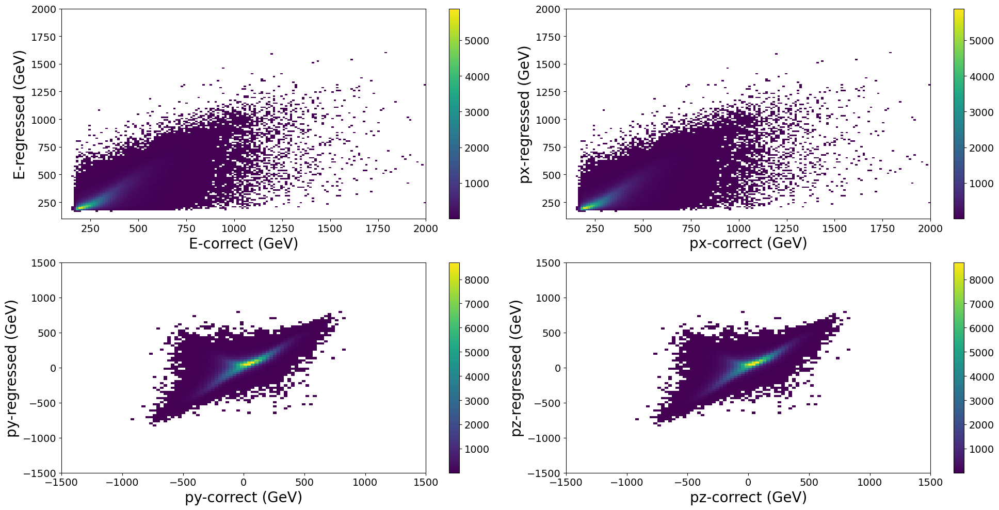

...

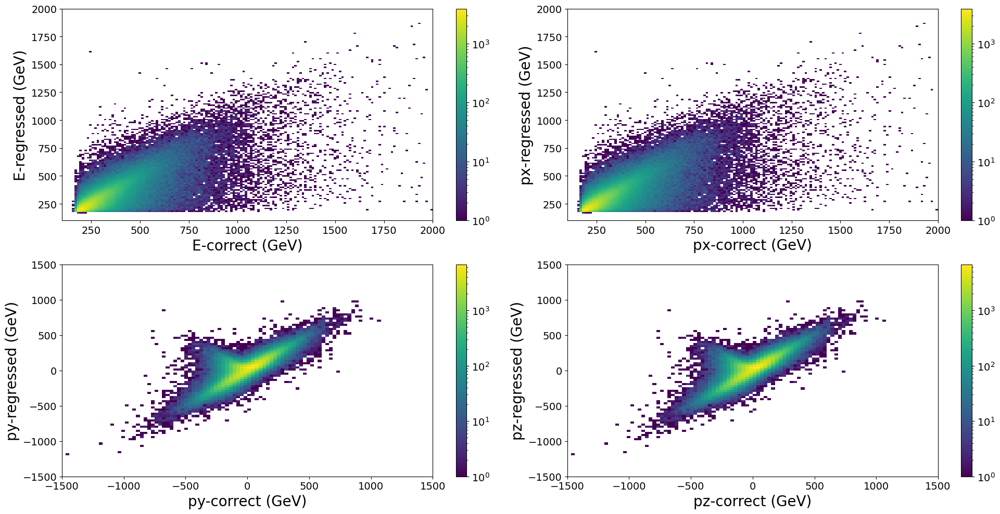

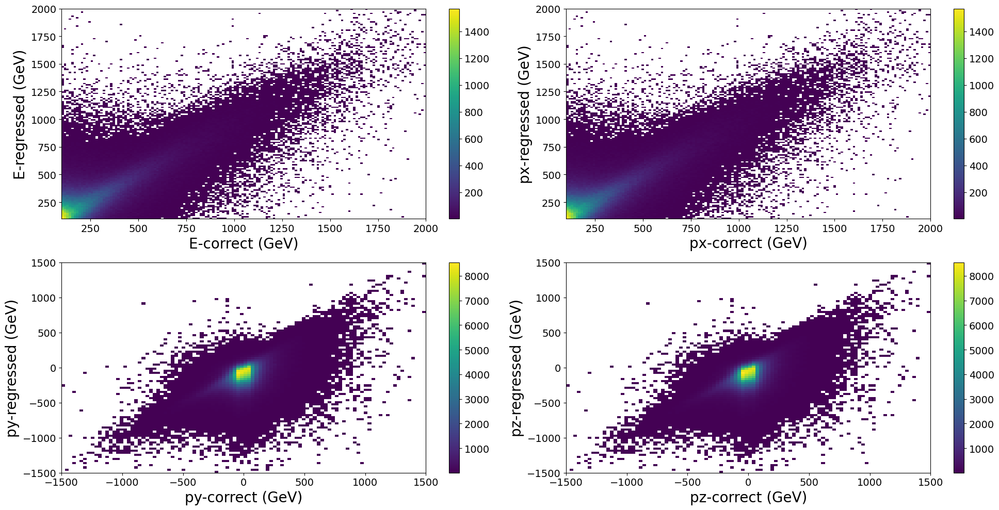

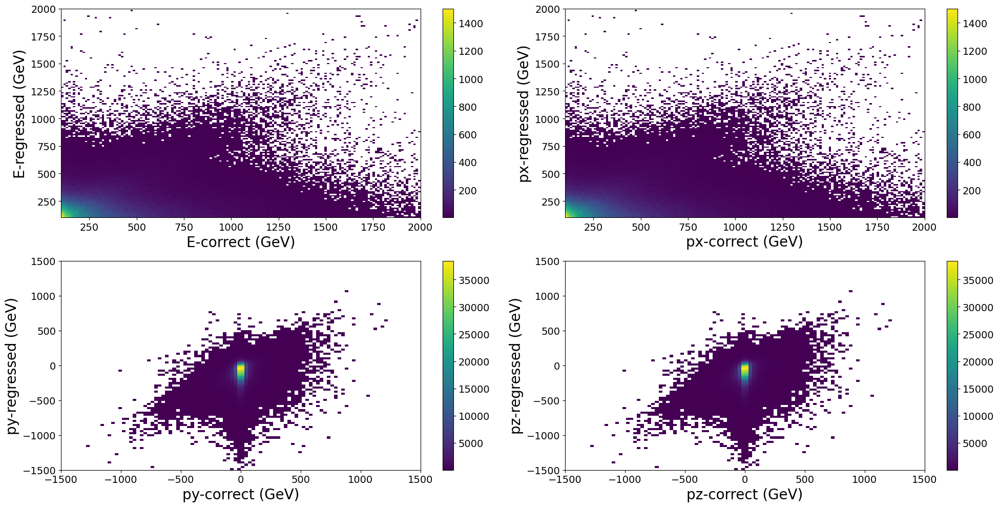

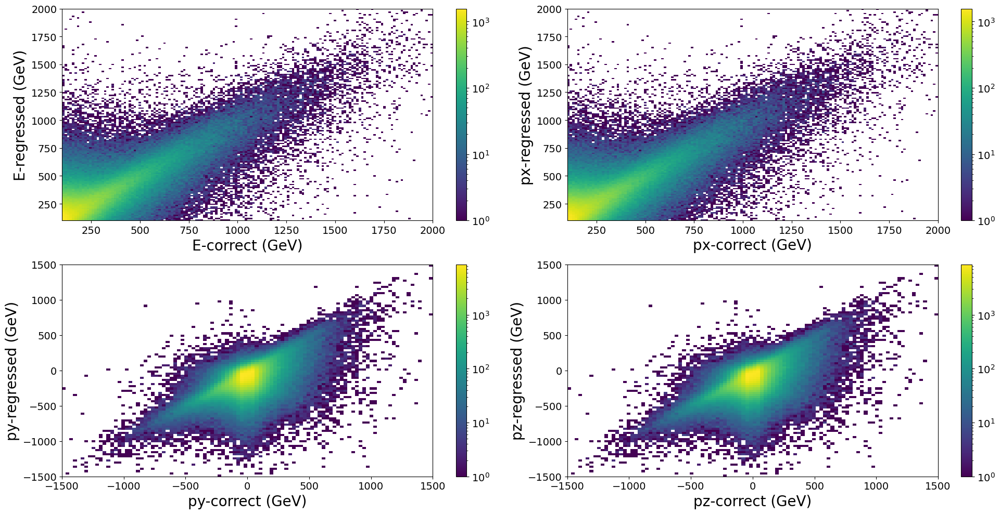

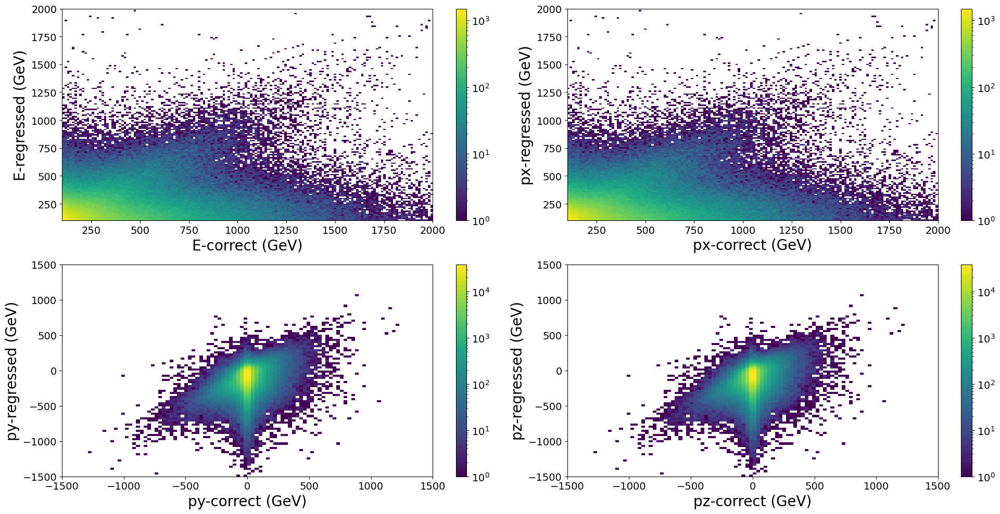

In [15]:
plots.plot_particle(particleCorrect=higgsCorrect, particle=higgs, particle_mask=higgs_mask,
                    nameFig='1.png', neg_Mask=False, log=False, nameunit='(GeV)')
plots.plot_particle(particleCorrect=higgsCorrect, particle=higgs, particle_mask=higgs_mask,
                    nameFig='2.png', neg_Mask=True, log=False, nameunit='(GeV)')
plots.plot_particle(particleCorrect=higgsCorrect, particle=higgs, particle_mask=higgs_mask,
                    nameFig='3.png', neg_Mask=False, log=True, nameunit='(GeV)')
plots.plot_particle(particleCorrect=higgsCorrect, particle=higgs, particle_mask=higgs_mask,
                    nameFig='4.png', neg_Mask=True, log=True, nameunit='(GeV)')

plots.plot_particle(particleCorrect=thadCorrect, particle=thad, particle_mask=thad_mask,
                    nameFig='5.png', neg_Mask=False, log=False, nameunit='(GeV)')
plots.plot_particle(particleCorrect=thadCorrect, particle=thad, particle_mask=thad_mask,
                    nameFig='6.png', neg_Mask=True, log=False, nameunit='(GeV)')
plots.plot_particle(particleCorrect=thadCorrect, particle=thad, particle_mask=thad_mask,
                    nameFig='7.png', neg_Mask=False, log=True, nameunit='(GeV)')
plots.plot_particle(particleCorrect=thadCorrect, particle=thad, particle_mask=thad_mask,
                    nameFig='8.png', neg_Mask=True, log=True, nameunit='(GeV)')

plots.plot_particle(particleCorrect=tlepCorrect, particle=tlep, particle_mask=tlep_mask,
                    nameFig='9.png', neg_Mask=False, log=False, nameunit='(GeV)')
plots.plot_particle(particleCorrect=tlepCorrect, particle=tlep, particle_mask=tlep_mask,
                    nameFig='10.png', neg_Mask=True, log=False, nameunit='(GeV)')
plots.plot_particle(particleCorrect=tlepCorrect, particle=tlep, particle_mask=tlep_mask,
                    nameFig='11.png', neg_Mask=False, log=True, nameunit='(GeV)')
plots.plot_particle(particleCorrect=tlepCorrect, particle=tlep, particle_mask=tlep_mask,
                    nameFig='12.png', neg_Mask=True, log=True, nameunit='(GeV)')

plots.plot_particle(particleCorrect=glISRCorrect, particle=glISR, particle_mask=ISR_mask,
                    nameFig='13.png', neg_Mask=False, log=False, nameunit='(GeV)')
plots.plot_particle(particleCorrect=glISRCorrect, particle=glISR, particle_mask=ISR_mask,
                    nameFig='14.png', neg_Mask=True, log=False, nameunit='(GeV)')
plots.plot_particle(particleCorrect=glISRCorrect, particle=glISR, particle_mask=ISR_mask,
                    nameFig='15.png', neg_Mask=False, log=True, nameunit='(GeV)')
plots.plot_particle(particleCorrect=glISRCorrect, particle=glISR, particle_mask=ISR_mask,
                    nameFig='16.png', neg_Mask=True, log=True, nameunit='(GeV)')

/work/adpetre/miniconda3/envs/dizertatie/lib/python3.11/site-packages/mplhep/utils.py:271: UserWarning: Integer weights indicate poissonian data. Will calculate Garwood interval if ``scipy`` is installed. Otherwise errors will be set to ``sqrt(w2)``.
  self.errors()
/work/adpetre/miniconda3/envs/dizertatie/lib/python3.11/site-packages/mplhep/utils.py:271: UserWarning: Integer weights indicate poissonian data. Will calculate Garwood interval if ``scipy`` is installed. Otherwise errors will be set to ``sqrt(w2)``.
  self.errors()
/work/adpetre/miniconda3/envs/dizertatie/lib/python3.11/site-packages/mplhep/utils.py:271: UserWarning: Integer weights indicate poissonian data. Will calculate Garwood interval if ``scipy`` is installed. Otherwise errors will be set to ``sqrt(w2)``.
  self.errors()
/work/adpetre/miniconda3/envs/dizertatie/lib/python3.11/site-packages/mplhep/utils.py:271: UserWarning: Integer weights indicate poissonian data. Will calculate Garwood interval if ``scipy`` is insta

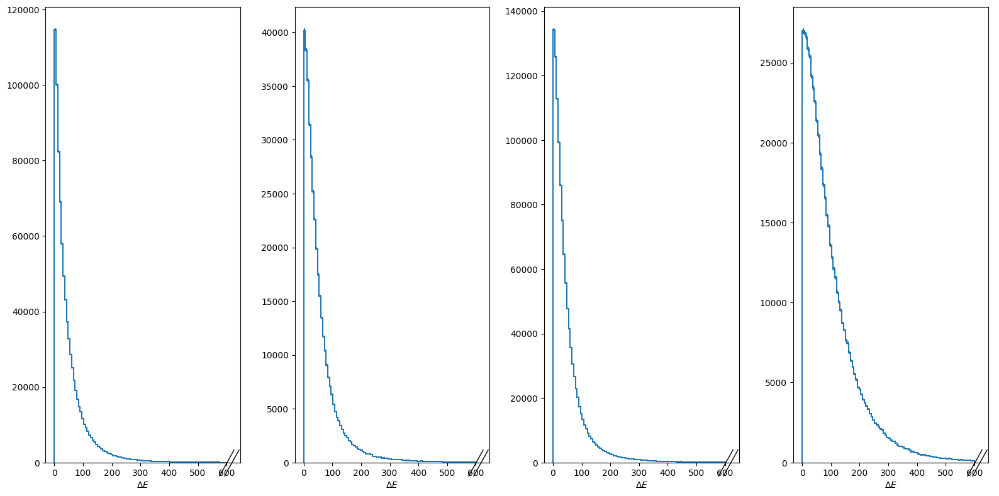

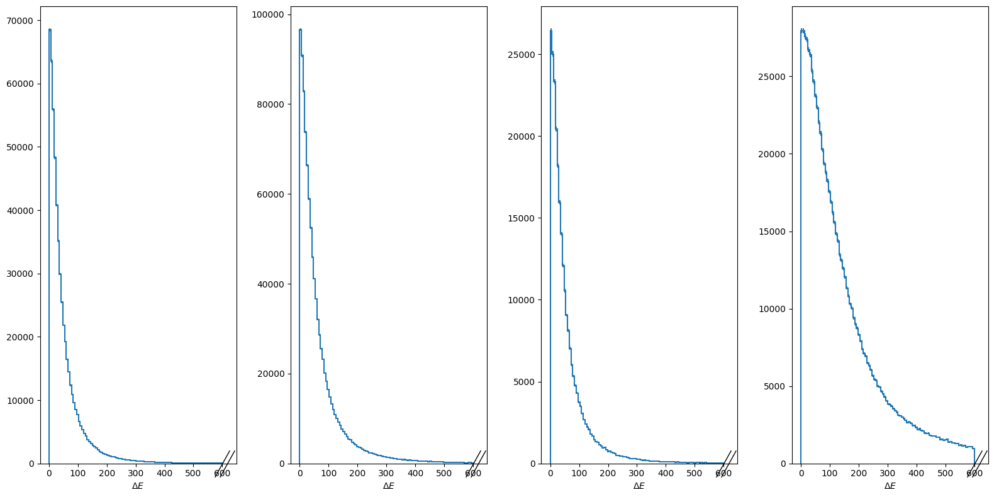

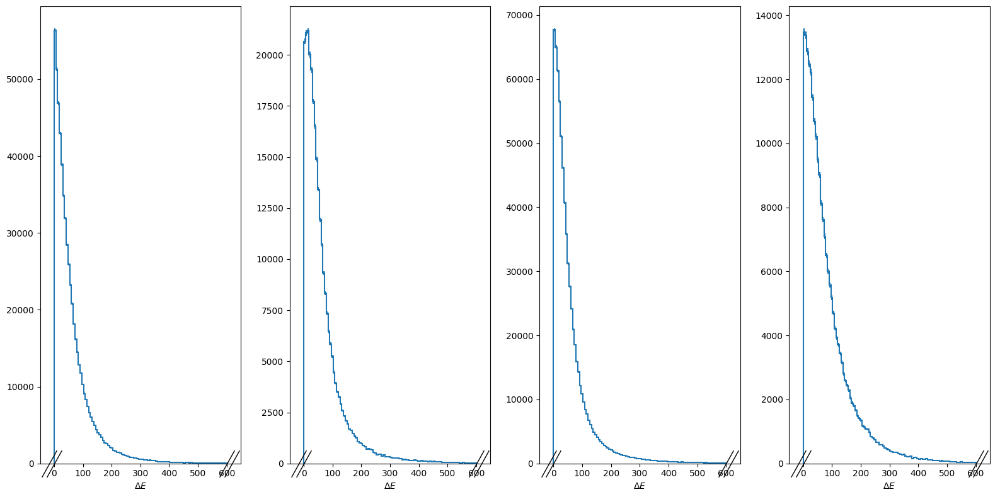

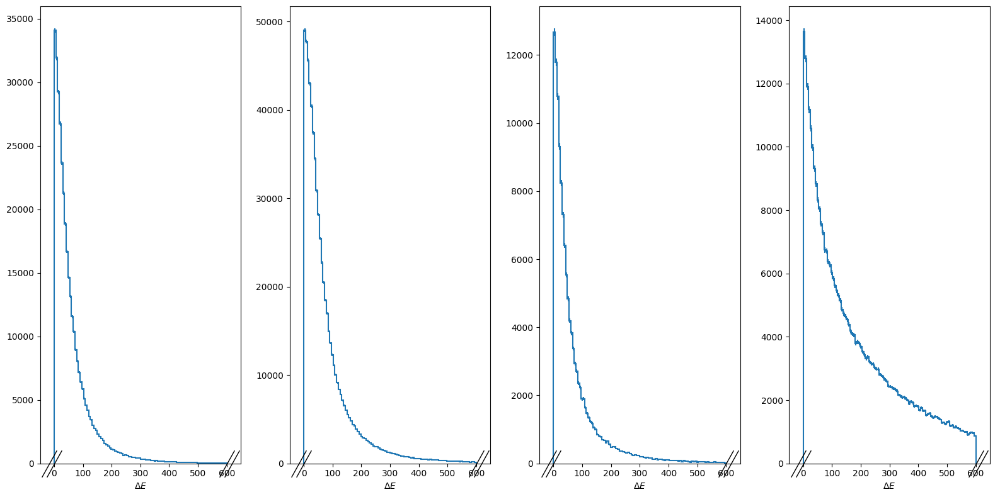

In [16]:
higgs_DiffE = np.abs(higgsCorrect.E - higgs.E)
thad_DiffE = np.abs(thadCorrect.E - thad.E)
tlep_DiffE = np.abs(tlepCorrect.E - tlep.E)
glISR_DiffE = np.abs(glISRCorrect.E - glISR.E)

plots.plot_var1d(higgs_var1=higgs_DiffE, thad_var1=thad_DiffE,
                 tlep_var1=tlep_DiffE, ISR_var1=glISR_DiffE,
                 name1='$\Delta E$', nameFig='17.png',
                 start1=0, stop1=600, bins1=100,
                 higgs_mask=higgs_mask, thad_mask=thad_mask, tlep_mask=tlep_mask, ISR_mask=ISR_mask,
                 neg_Mask=False, log=False)

plots.plot_var1d(higgs_var1=higgs_DiffE, thad_var1=thad_DiffE,
                 tlep_var1=tlep_DiffE, ISR_var1=glISR_DiffE,
                 name1='$\Delta E$', nameFig='18.png',
                 start1=0, stop1=600, bins1=100,
                 higgs_mask=higgs_mask, thad_mask=thad_mask, tlep_mask=tlep_mask, ISR_mask=ISR_mask,
                 neg_Mask=True, log=False)

higgs_DiffE = higgsCorrect.E - higgs.E
thad_DiffE = thadCorrect.E - thad.E
tlep_DiffE = tlepCorrect.E - tlep.E
glISR_DiffE = glISRCorrect.E - glISR.E

plots.plot_var1d(higgs_var1=higgs_DiffE, thad_var1=thad_DiffE,
                 tlep_var1=tlep_DiffE, ISR_var1=glISR_DiffE,
                 name1='$\Delta E$', nameFig='19.png',
                 start1=0, stop1=600, bins1=100,
                 higgs_mask=higgs_mask, thad_mask=thad_mask, tlep_mask=tlep_mask, ISR_mask=ISR_mask,
                 neg_Mask=False, log=False)

plots.plot_var1d(higgs_var1=higgs_DiffE, thad_var1=thad_DiffE,
                 tlep_var1=tlep_DiffE, ISR_var1=glISR_DiffE,
                 name1='$\Delta E$', nameFig='20.png',
                 start1=0, stop1=600, bins1=100,
                 higgs_mask=higgs_mask, thad_mask=thad_mask, tlep_mask=tlep_mask, ISR_mask=ISR_mask,
                 neg_Mask=True, log=False)

/work/adpetre/miniconda3/envs/dizertatie/lib/python3.11/site-packages/mplhep/utils.py:271: UserWarning: Integer weights indicate poissonian data. Will calculate Garwood interval if ``scipy`` is installed. Otherwise errors will be set to ``sqrt(w2)``.
  self.errors()
/work/adpetre/miniconda3/envs/dizertatie/lib/python3.11/site-packages/mplhep/utils.py:271: UserWarning: Integer weights indicate poissonian data. Will calculate Garwood interval if ``scipy`` is installed. Otherwise errors will be set to ``sqrt(w2)``.
  self.errors()
/work/adpetre/miniconda3/envs/dizertatie/lib/python3.11/site-packages/mplhep/utils.py:271: UserWarning: Integer weights indicate poissonian data. Will calculate Garwood interval if ``scipy`` is installed. Otherwise errors will be set to ``sqrt(w2)``.
  self.errors()
/work/adpetre/miniconda3/envs/dizertatie/lib/python3.11/site-packages/mplhep/utils.py:271: UserWarning: Integer weights indicate poissonian data. Will calculate Garwood interval if ``scipy`` is insta

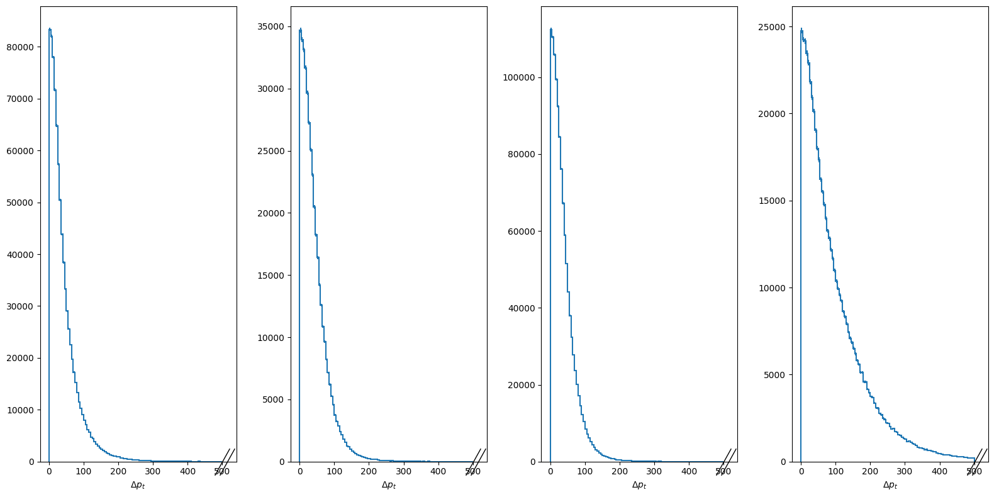

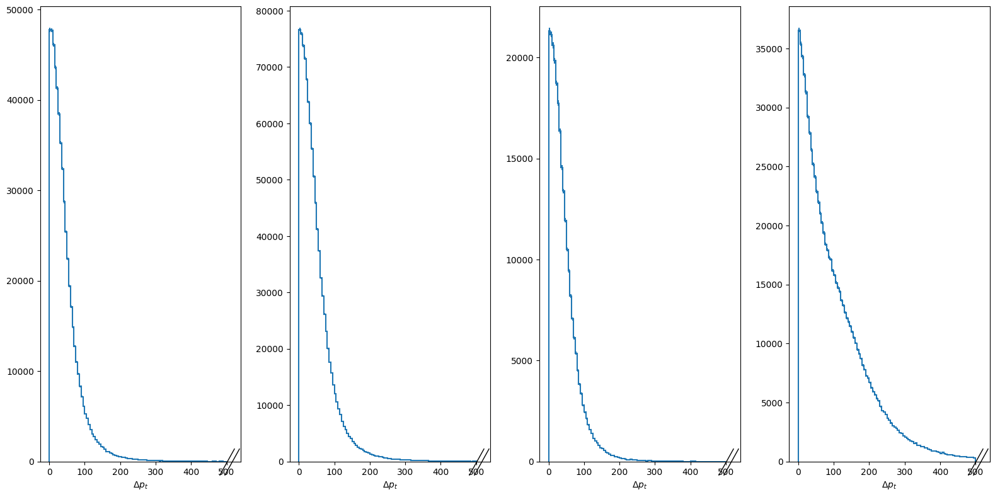

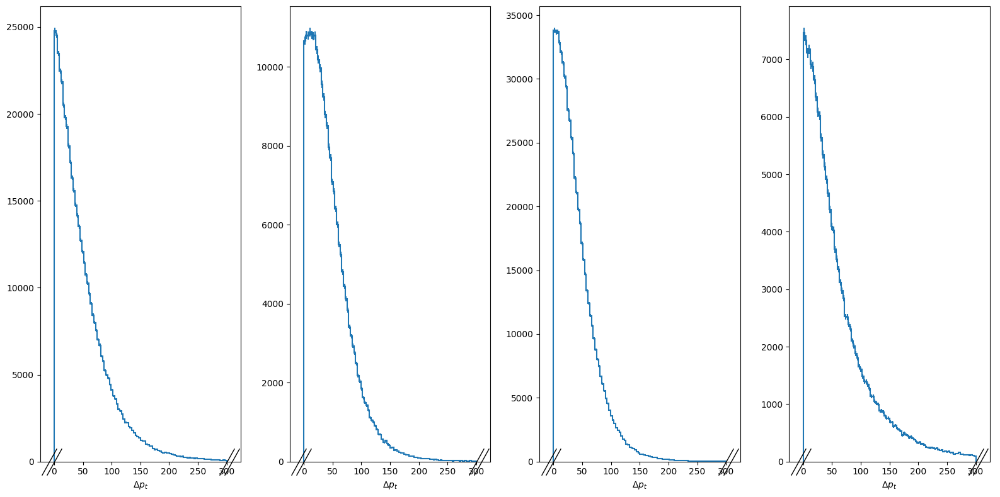

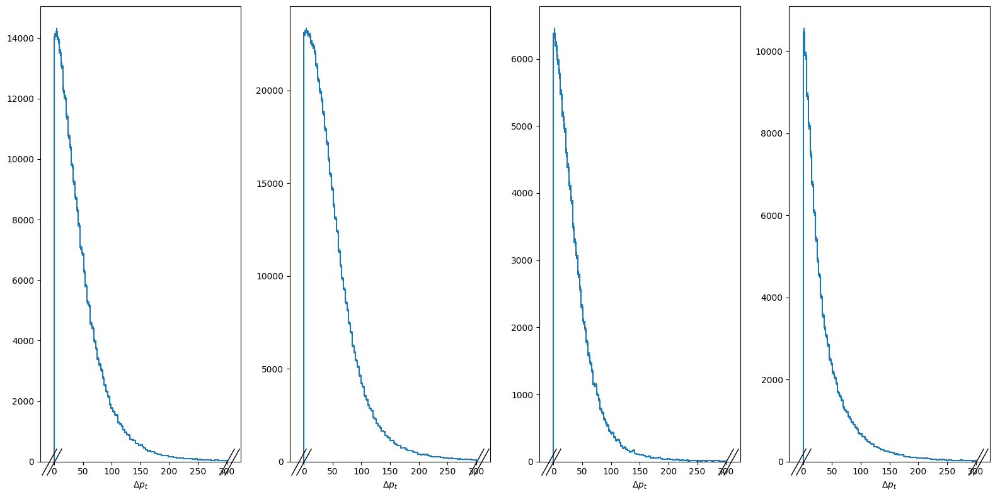

In [17]:
higgs_DiffPt = np.abs(higgsCorrect.pt - higgs.pt)
thad_DiffPt = np.abs(thadCorrect.pt - thad.pt)
tlep_DiffPt = np.abs(tlepCorrect.pt - tlep.pt)
glISR_DiffPt = np.abs(glISRCorrect.pt - glISR.pt)

plots.plot_var1d(higgs_var1=higgs_DiffPt, thad_var1=thad_DiffPt,
                 tlep_var1=tlep_DiffPt, ISR_var1=glISR_DiffPt,
                 name1='$\Delta p_t$', nameFig='21.png',
                 start1=0, stop1=500, bins1=100,
                 higgs_mask=higgs_mask, thad_mask=thad_mask, tlep_mask=tlep_mask, ISR_mask=ISR_mask,
                 neg_Mask=False, log=False)

plots.plot_var1d(higgs_var1=higgs_DiffPt, thad_var1=thad_DiffPt,
                 tlep_var1=tlep_DiffPt, ISR_var1=glISR_DiffPt,
                 name1='$\Delta p_t$', nameFig='22.png',
                 start1=0, stop1=500, bins1=100,
                 higgs_mask=higgs_mask, thad_mask=thad_mask, tlep_mask=tlep_mask, ISR_mask=ISR_mask,
                 neg_Mask=True, log=False)

higgs_DiffPt = higgsCorrect.pt - higgs.pt
thad_DiffPt = thadCorrect.pt - thad.pt
tlep_DiffPt = tlepCorrect.pt - tlep.pt
glISR_DiffPt = glISRCorrect.pt - glISR.pt

plots.plot_var1d(higgs_var1=higgs_DiffPt, thad_var1=thad_DiffPt,
                 tlep_var1=tlep_DiffPt, ISR_var1=glISR_DiffPt,
                 name1='$\Delta p_t$', nameFig='23.png',
                 start1=0, stop1=300, bins1=100,
                 higgs_mask=higgs_mask, thad_mask=thad_mask, tlep_mask=tlep_mask, ISR_mask=ISR_mask,
                 neg_Mask=False, log=False)

plots.plot_var1d(higgs_var1=higgs_DiffPt, thad_var1=thad_DiffPt,
                 tlep_var1=tlep_DiffPt, ISR_var1=glISR_DiffPt,
                 name1='$\Delta p_t$', nameFig='24.png',
                 start1=0, stop1=300, bins1=100,
                 higgs_mask=higgs_mask, thad_mask=thad_mask, tlep_mask=tlep_mask, ISR_mask=ISR_mask,
                 neg_Mask=True, log=False)

/work/adpetre/miniconda3/envs/dizertatie/lib/python3.11/site-packages/mplhep/utils.py:271: UserWarning: Integer weights indicate poissonian data. Will calculate Garwood interval if ``scipy`` is installed. Otherwise errors will be set to ``sqrt(w2)``.
  self.errors()
/work/adpetre/miniconda3/envs/dizertatie/lib/python3.11/site-packages/mplhep/utils.py:271: UserWarning: Integer weights indicate poissonian data. Will calculate Garwood interval if ``scipy`` is installed. Otherwise errors will be set to ``sqrt(w2)``.
  self.errors()
/work/adpetre/miniconda3/envs/dizertatie/lib/python3.11/site-packages/mplhep/utils.py:271: UserWarning: Integer weights indicate poissonian data. Will calculate Garwood interval if ``scipy`` is installed. Otherwise errors will be set to ``sqrt(w2)``.
  self.errors()
/work/adpetre/miniconda3/envs/dizertatie/lib/python3.11/site-packages/mplhep/utils.py:271: UserWarning: Integer weights indicate poissonian data. Will calculate Garwood interval if ``scipy`` is insta

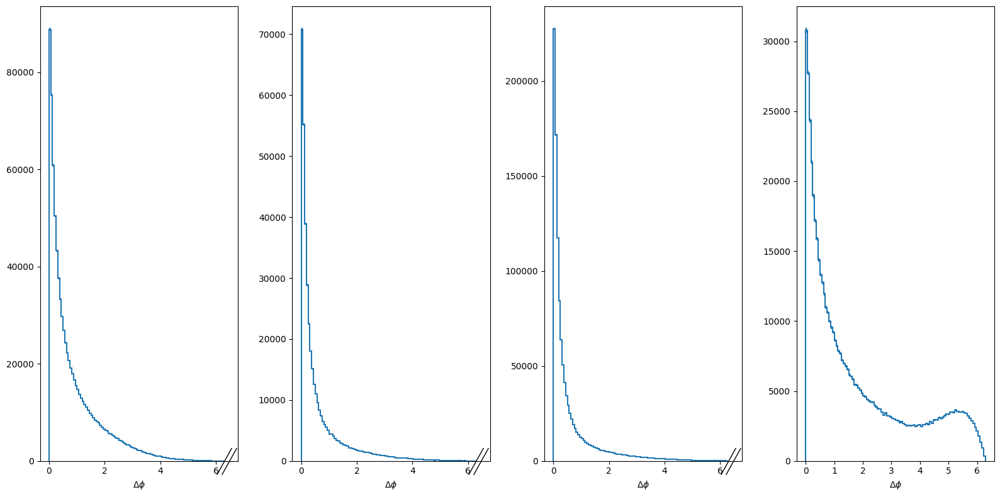

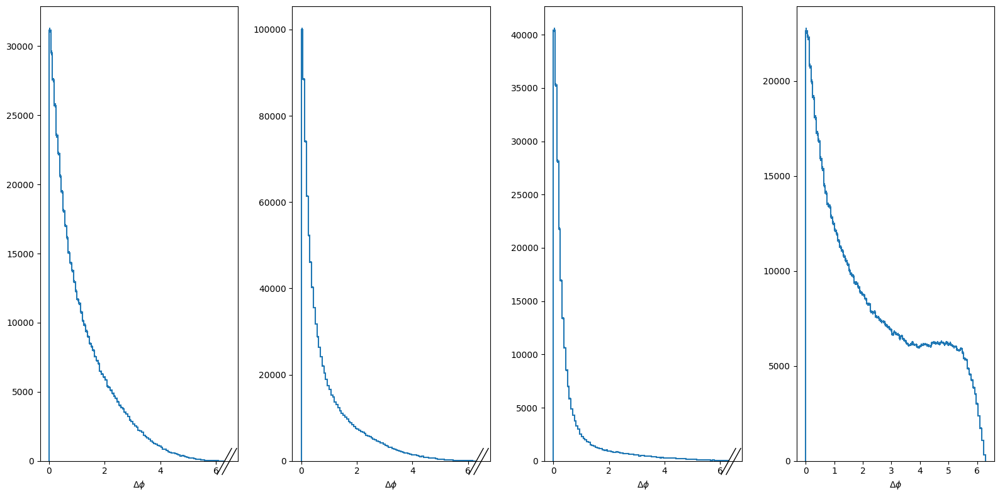

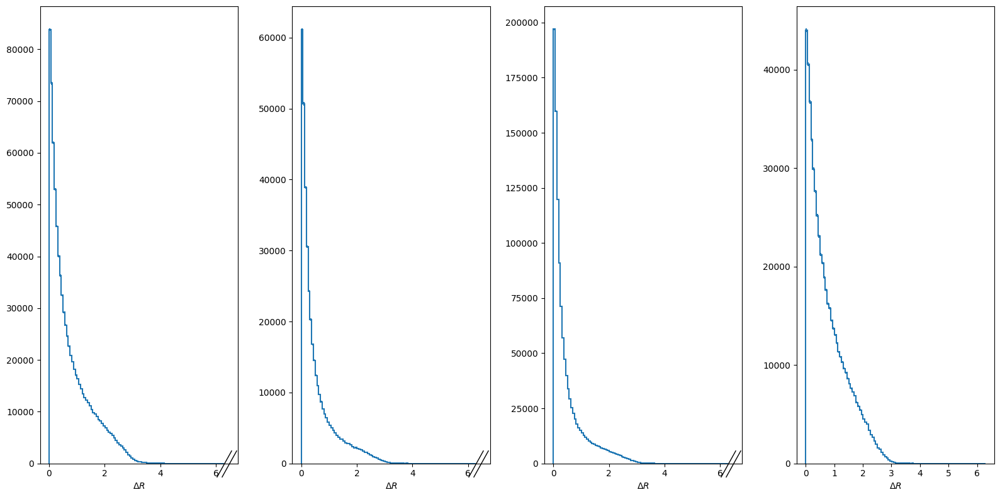

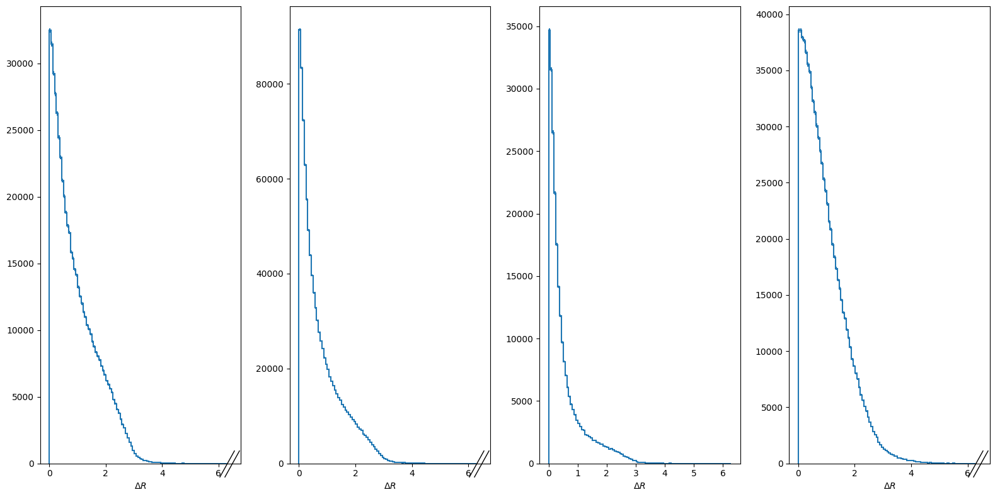

In [18]:
higgs_DiffPhi = np.abs(higgsCorrect.phi - higgs.phi)
thad_DiffPhi = np.abs(thadCorrect.phi - thad.phi)
tlep_DiffPhi = np.abs(tlepCorrect.phi - tlep.phi)
glISR_DiffPhi = np.abs(glISRCorrect.phi - glISR.phi)

plots.plot_var1d(higgs_var1=higgs_DiffPhi, thad_var1=thad_DiffPhi,
                 tlep_var1=tlep_DiffPhi, ISR_var1=glISR_DiffPhi,
                 name1='$\Delta \phi$', nameFig='25.png',
                 start1=0, stop1=2*pi, bins1=100,
                 higgs_mask=higgs_mask, thad_mask=thad_mask, tlep_mask=tlep_mask, ISR_mask=ISR_mask,
                 neg_Mask=False, log=False)

plots.plot_var1d(higgs_var1=higgs_DiffPhi, thad_var1=thad_DiffPhi,
                 tlep_var1=tlep_DiffPhi, ISR_var1=glISR_DiffPhi,
                 name1='$\Delta \phi$', nameFig='26.png',
                 start1=0, stop1=2*pi, bins1=100,
                 higgs_mask=higgs_mask, thad_mask=thad_mask, tlep_mask=tlep_mask, ISR_mask=ISR_mask,
                 neg_Mask=True, log=False)

higgs_DiffR = np.abs(np.sqrt(higgs.phi**2 + higgs.eta**2) -  np.sqrt(higgsCorrect.phi**2 + higgsCorrect.eta**2))
thad_DiffR = np.abs(np.sqrt(thad.phi**2 + thad.eta**2) -  np.sqrt(thadCorrect.phi**2 + thadCorrect.eta**2))
tlep_DiffR = np.abs(np.sqrt(tlep.phi**2 + tlep.eta**2) -  np.sqrt(tlepCorrect.phi**2 + tlepCorrect.eta**2))
glISR_DiffR = np.abs(np.sqrt(glISR.phi**2 + glISR.eta**2) -  np.sqrt(glISRCorrect.phi**2 + glISRCorrect.eta**2))

plots.plot_var1d(higgs_var1=higgs_DiffR, thad_var1=thad_DiffR,
                 tlep_var1=tlep_DiffR, ISR_var1=glISR_DiffR,
                 name1='$\Delta R$', nameFig='27.png',
                 start1=0, stop1=2*pi, bins1=100,
                 higgs_mask=higgs_mask, thad_mask=thad_mask, tlep_mask=tlep_mask, ISR_mask=ISR_mask,
                 neg_Mask=False, log=False)

plots.plot_var1d(higgs_var1=higgs_DiffR, thad_var1=thad_DiffR,
                 tlep_var1=tlep_DiffR, ISR_var1=glISR_DiffR,
                 name1='$\Delta R$', nameFig='28.png',
                 start1=0, stop1=2*pi, bins1=100,
                 higgs_mask=higgs_mask, thad_mask=thad_mask, tlep_mask=tlep_mask, ISR_mask=ISR_mask,
                 neg_Mask=True, log=False)

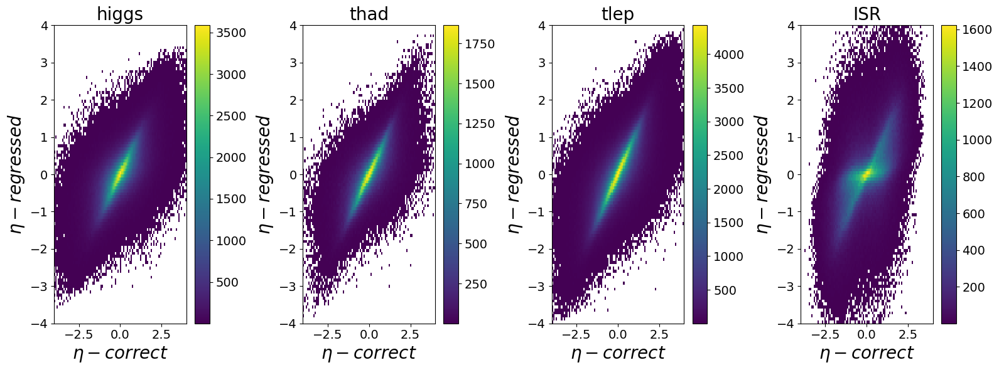

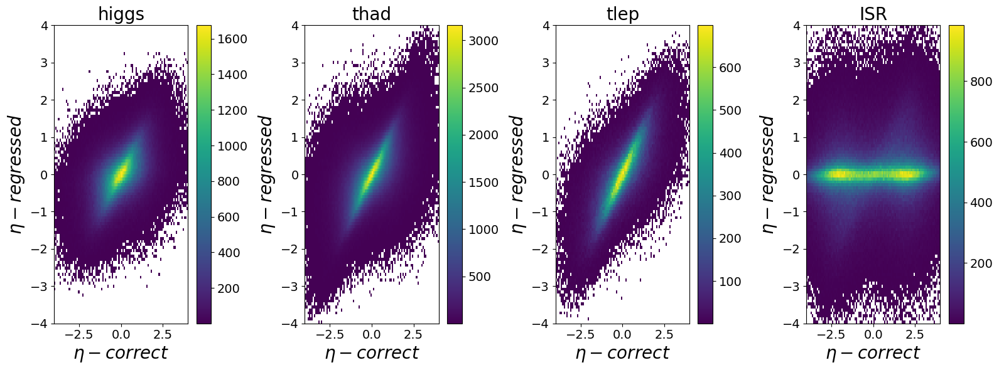

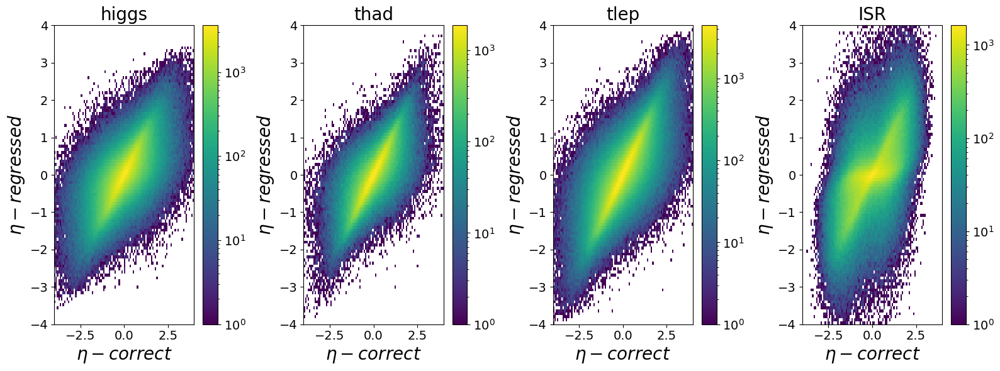

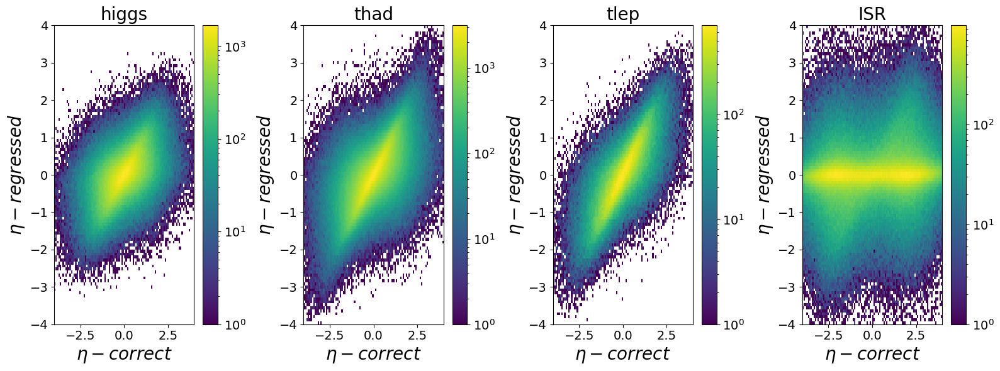

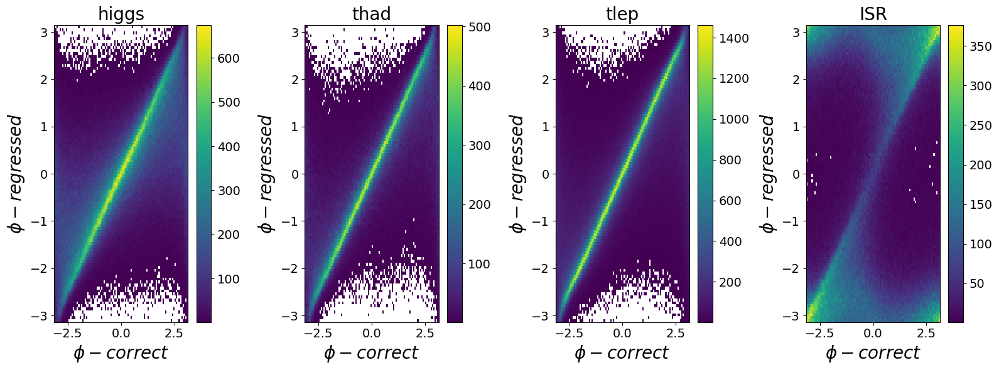

...

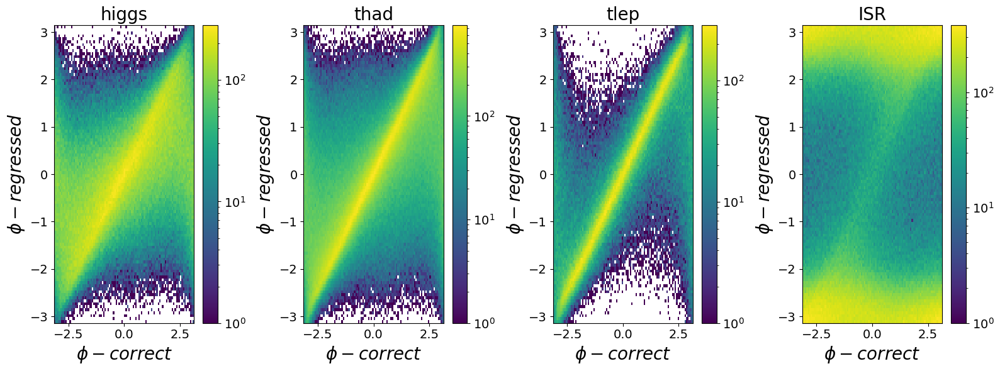

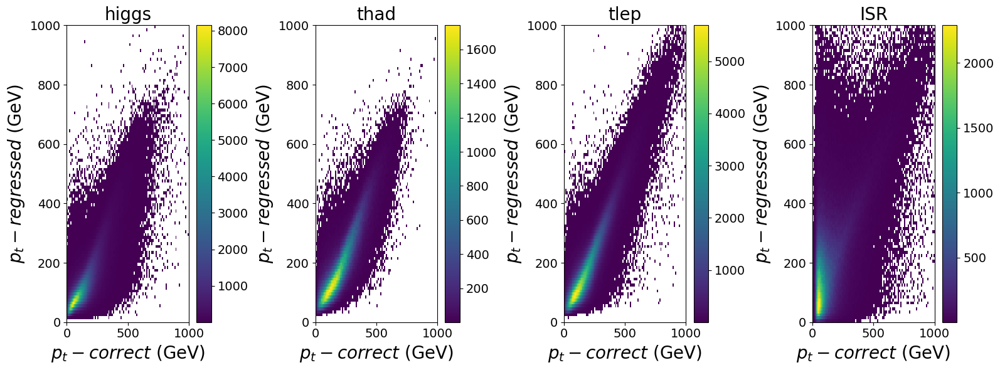

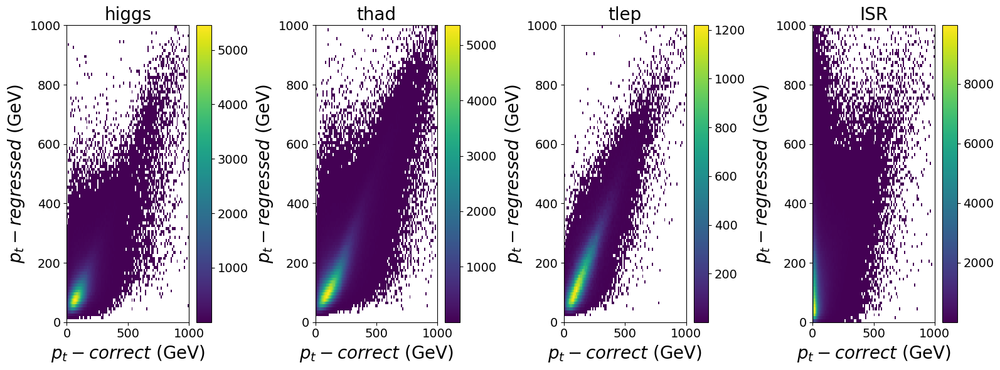

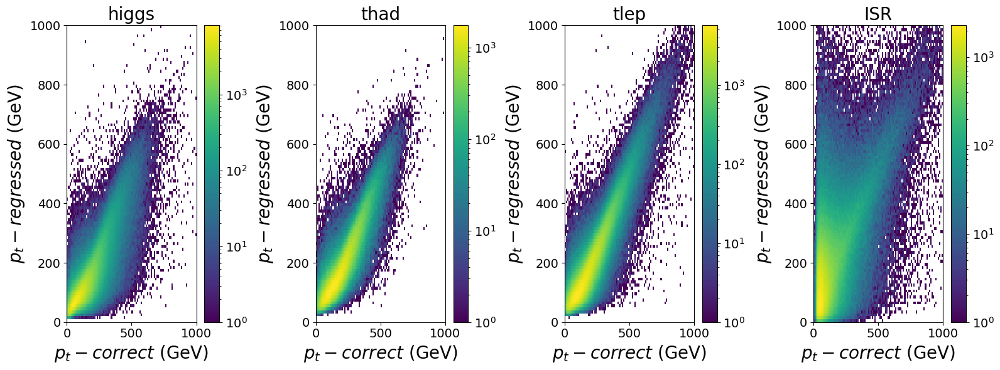

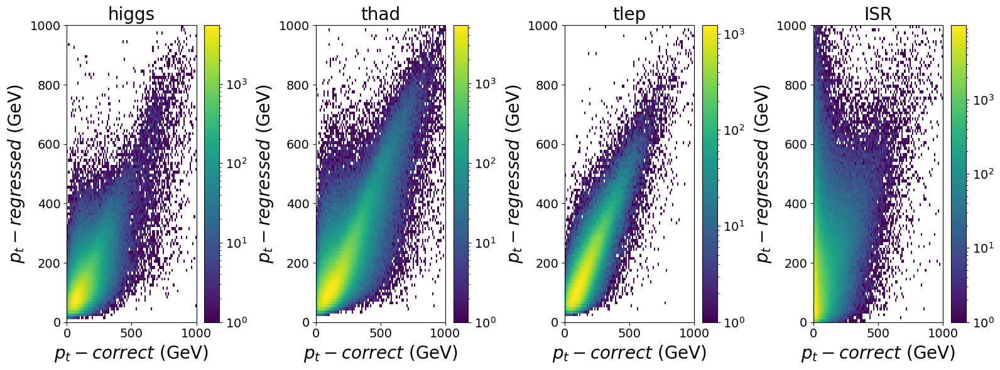

In [21]:
#eta
plots.plot_var2d(higgs_var1=higgsCorrect.eta, higgs_var2=higgs.eta,
           thad_var1=thadCorrect.eta, thad_var2=thad.eta,
           tlep_var1=tlepCorrect.eta, tlep_var2=tlep.eta,
           ISR_var1=glISRCorrect.eta, ISR_var2=glISR.eta,
           name1='$\eta-correct$', name2='$\eta-regressed$', nameFig='29.png', 
           start1=-4, stop1=4, start2=-4, stop2=4, bins1=100, bins2=100,
           higgs_mask=higgs_mask, thad_mask=thad_mask, tlep_mask=tlep_mask, ISR_mask=ISR_mask,
           neg_Mask=False, log=False, nameunit='')

plots.plot_var2d(higgs_var1=higgsCorrect.eta, higgs_var2=higgs.eta,
           thad_var1=thadCorrect.eta, thad_var2=thad.eta,
           tlep_var1=tlepCorrect.eta, tlep_var2=tlep.eta,
           ISR_var1=glISRCorrect.eta, ISR_var2=glISR.eta,
           name1='$\eta-correct$', name2='$\eta-regressed$', nameFig='30.png', 
           start1=-4, stop1=4, start2=-4, stop2=4, bins1=100, bins2=100,
           higgs_mask=higgs_mask, thad_mask=thad_mask, tlep_mask=tlep_mask, ISR_mask=ISR_mask,
           neg_Mask=True, log=False, nameunit='')

plots.plot_var2d(higgs_var1=higgsCorrect.eta, higgs_var2=higgs.eta,
           thad_var1=thadCorrect.eta, thad_var2=thad.eta,
           tlep_var1=tlepCorrect.eta, tlep_var2=tlep.eta,
           ISR_var1=glISRCorrect.eta, ISR_var2=glISR.eta,
           name1='$\eta-correct$', name2='$\eta-regressed$', nameFig='31.png', 
           start1=-4, stop1=4, start2=-4, stop2=4, bins1=100, bins2=100,
           higgs_mask=higgs_mask, thad_mask=thad_mask, tlep_mask=tlep_mask, ISR_mask=ISR_mask,
           neg_Mask=False, log=True, nameunit='')

plots.plot_var2d(higgs_var1=higgsCorrect.eta, higgs_var2=higgs.eta,
           thad_var1=thadCorrect.eta, thad_var2=thad.eta,
           tlep_var1=tlepCorrect.eta, tlep_var2=tlep.eta,
           ISR_var1=glISRCorrect.eta, ISR_var2=glISR.eta,
           name1='$\eta-correct$', name2='$\eta-regressed$', nameFig='32.png', 
           start1=-4, stop1=4, start2=-4, stop2=4, bins1=100, bins2=100,
           higgs_mask=higgs_mask, thad_mask=thad_mask, tlep_mask=tlep_mask, ISR_mask=ISR_mask,
           neg_Mask=True, log=True, nameunit='')


# phi
plots.plot_var2d(higgs_var1=higgsCorrect.phi, higgs_var2=higgs.phi,
           thad_var1=thadCorrect.phi, thad_var2=thad.phi,
           tlep_var1=tlepCorrect.phi, tlep_var2=tlep.phi,
           ISR_var1=glISRCorrect.phi, ISR_var2=glISR.phi,
           name1='$\phi-correct$', name2='$\phi-regressed$', nameFig='33.png', 
           start1=-pi, stop1=pi, start2=-pi, stop2=pi, bins1=100, bins2=100,
           higgs_mask=higgs_mask, thad_mask=thad_mask, tlep_mask=tlep_mask, ISR_mask=ISR_mask,
           neg_Mask=False, log=False, nameunit='')

plots.plot_var2d(higgs_var1=higgsCorrect.phi, higgs_var2=higgs.phi,
           thad_var1=thadCorrect.phi, thad_var2=thad.phi,
           tlep_var1=tlepCorrect.phi, tlep_var2=tlep.phi,
           ISR_var1=glISRCorrect.phi, ISR_var2=glISR.phi,
           name1='$\phi-correct$', name2='$\phi-regressed$', nameFig='34.png', 
           start1=-pi, stop1=pi, start2=-pi, stop2=pi, bins1=100, bins2=100,
           higgs_mask=higgs_mask, thad_mask=thad_mask, tlep_mask=tlep_mask, ISR_mask=ISR_mask,
           neg_Mask=True, log=False, nameunit='')

plots.plot_var2d(higgs_var1=higgsCorrect.phi, higgs_var2=higgs.phi,
           thad_var1=thadCorrect.phi, thad_var2=thad.phi,
           tlep_var1=tlepCorrect.phi, tlep_var2=tlep.phi,
           ISR_var1=glISRCorrect.phi, ISR_var2=glISR.phi,
           name1='$\phi-correct$', name2='$\phi-regressed$', nameFig='35.png', 
           start1=-pi, stop1=pi, start2=-pi, stop2=pi, bins1=100, bins2=100,
           higgs_mask=higgs_mask, thad_mask=thad_mask, tlep_mask=tlep_mask, ISR_mask=ISR_mask,
           neg_Mask=False, log=True, nameunit='')

plots.plot_var2d(higgs_var1=higgsCorrect.phi, higgs_var2=higgs.phi,
           thad_var1=thadCorrect.phi, thad_var2=thad.phi,
           tlep_var1=tlepCorrect.phi, tlep_var2=tlep.phi,
           ISR_var1=glISRCorrect.phi, ISR_var2=glISR.phi,
           name1='$\phi-correct$', name2='$\phi-regressed$', nameFig='36.png', 
           start1=-pi, stop1=pi, start2=-pi, stop2=pi, bins1=100, bins2=100,
           higgs_mask=higgs_mask, thad_mask=thad_mask, tlep_mask=tlep_mask, ISR_mask=ISR_mask,
           neg_Mask=True, log=True, nameunit='')

# pt
plots.plot_var2d(higgs_var1=higgsCorrect.pt, higgs_var2=higgs.pt,
           thad_var1=thadCorrect.pt, thad_var2=thad.pt,
           tlep_var1=tlepCorrect.pt, tlep_var2=tlep.pt,
           ISR_var1=glISRCorrect.pt, ISR_var2=glISR.pt,
           name1='$p_t-correct$', name2='$p_t-regressed$', nameFig='37.png', 
           start1=0, stop1=1000, start2=0, stop2=1000, bins1=100, bins2=100,
           higgs_mask=higgs_mask, thad_mask=thad_mask, tlep_mask=tlep_mask, ISR_mask=ISR_mask,
           neg_Mask=False, log=False, nameunit='(GeV)')

plots.plot_var2d(higgs_var1=higgsCorrect.pt, higgs_var2=higgs.pt,
           thad_var1=thadCorrect.pt, thad_var2=thad.pt,
           tlep_var1=tlepCorrect.pt, tlep_var2=tlep.pt,
           ISR_var1=glISRCorrect.pt, ISR_var2=glISR.pt,
           name1='$p_t-correct$', name2='$p_t-regressed$', nameFig='38.png', 
           start1=0, stop1=1000, start2=0, stop2=1000, bins1=100, bins2=100,
           higgs_mask=higgs_mask, thad_mask=thad_mask, tlep_mask=tlep_mask, ISR_mask=ISR_mask,
           neg_Mask=True, log=False, nameunit='(GeV)')

plots.plot_var2d(higgs_var1=higgsCorrect.pt, higgs_var2=higgs.pt,
           thad_var1=thadCorrect.pt, thad_var2=thad.pt,
           tlep_var1=tlepCorrect.pt, tlep_var2=tlep.pt,
           ISR_var1=glISRCorrect.pt, ISR_var2=glISR.pt,
           name1='$p_t-correct$', name2='$p_t-regressed$', nameFig='39.png', 
           start1=0, stop1=1000, start2=0, stop2=1000, bins1=100, bins2=100,
           higgs_mask=higgs_mask, thad_mask=thad_mask, tlep_mask=tlep_mask, ISR_mask=ISR_mask,
           neg_Mask=False, log=True, nameunit='(GeV)')

plots.plot_var2d(higgs_var1=higgsCorrect.pt, higgs_var2=higgs.pt,
           thad_var1=thadCorrect.pt, thad_var2=thad.pt,
           tlep_var1=tlepCorrect.pt, tlep_var2=tlep.pt,
           ISR_var1=glISRCorrect.pt, ISR_var2=glISR.pt,
           name1='$p_t-correct$', name2='$p_t-regressed$', nameFig='40.png', 
          start1=0, stop1=1000, start2=0, stop2=1000, bins1=100, bins2=100,
           higgs_mask=higgs_mask, thad_mask=thad_mask, tlep_mask=tlep_mask, ISR_mask=ISR_mask,
           neg_Mask=True, log=True, nameunit='(GeV)')

In [131]:
# R
higgsCorR = np.sqrt(higgsCorrect.phi**2 + higgsCorrect.eta**2)
higgsR = np.sqrt(higgs.phi**2 + higgs.eta**2)

thadCorR = np.sqrt(thadCorrect.phi**2 + thadCorrect.eta**2)
thadR = np.sqrt(thad.phi**2 + thad.eta**2)

tlepCorR = np.sqrt(tlepCorrect.phi**2 + tlepCorrect.eta**2)
tlepR = np.sqrt(tlep.phi**2 + tlep.eta**2)

ISRCor_R = np.sqrt(glISRCorrect.phi**2 + glISRCorrect.eta**2)
ISR_R = np.sqrt(glISR.phi**2 + glISR.eta**2)

plots.plot_var2d(higgs_var1=higgsCorR, higgs_var2=higgsR,
           thad_var1=thadCorR, thad_var2=thadR,
           tlep_var1=tlepCorR, tlep_var2=tlepR,
           ISR_var1=ISRCor_R, ISR_var2=ISR_R,
           name1='$R-correct$', name2='$R-regressed$', nameFig='41.png', 
           start1=0, stop1=6, start2=0, stop2=6, bins1=100, bins2=100,
           higgs_mask=higgs_mask, thad_mask=thad_mask, tlep_mask=tlep_mask, ISR_mask=ISR_mask,
           neg_Mask=False, log=False, nameunit='')

plots.plot_var2d(higgs_var1=higgsCorR, higgs_var2=higgsR,
           thad_var1=thadCorR, thad_var2=thadR,
           tlep_var1=tlepCorR, tlep_var2=tlepR,
           ISR_var1=ISRCor_R, ISR_var2=ISR_R,
           name1='$R-correct$', name2='$R-regressed$', nameFig='42.png', 
           start1=0, stop1=6, start2=0, stop2=6, bins1=100, bins2=100,
           higgs_mask=higgs_mask, thad_mask=thad_mask, tlep_mask=tlep_mask, ISR_mask=ISR_mask,
           neg_Mask=True, log=False, nameunit='')

plots.plot_var2d(higgs_var1=higgsCorR, higgs_var2=higgsR,
           thad_var1=thadCorR, thad_var2=thadR,
           tlep_var1=tlepCorR, tlep_var2=tlepR,
           ISR_var1=ISRCor_R, ISR_var2=ISR_R,
           name1='$R-correct$', name2='$R-regressed$', nameFig='43.png', 
           start1=0, stop1=6, start2=0, stop2=6, bins1=100, bins2=100,
           higgs_mask=higgs_mask, thad_mask=thad_mask, tlep_mask=tlep_mask, ISR_mask=ISR_mask,
           neg_Mask=False, log=True, nameunit='')

plots.plot_var2d(higgs_var1=higgsCorR, higgs_var2=higgsR,
           thad_var1=thadCorR, thad_var2=thadR,
           tlep_var1=tlepCorR, tlep_var2=tlepR,
           ISR_var1=ISRCor_R, ISR_var2=ISR_R,
           name1='$R-correct$', name2='$R-regressed$', nameFig='44.png', 
           start1=0, stop1=6, start2=0, stop2=6, bins1=100, bins2=100,
           higgs_mask=higgs_mask, thad_mask=thad_mask, tlep_mask=tlep_mask, ISR_mask=ISR_mask,
           neg_Mask=True, log=True, nameunit='')


# eta vs DiffPt
higgs_DiffPt = higgsCorrect.pt - higgs.pt
thad_DiffPt = thadCorrect.pt - thad.pt
tlep_DiffPt = tlepCorrect.pt - tlep.pt
glISR_DiffPt = glISRCorrect.pt - glISR.pt

plots.plot_var2d(higgs_var1=higgsCorrect.eta, higgs_var2=higgs_DiffPt,
           thad_var1=thadCorrect.eta, thad_var2=thad_DiffPt,
           tlep_var1=tlepCorrect.eta, tlep_var2=tlep_DiffPt,
           ISR_var1=glISRCorrect.eta, ISR_var2=glISR_DiffPt,
           name1='$\eta-correct$', name2='$\Delta p_t (GeV)$', nameFig='45.png', 
           start1=-4, stop1=4, start2=-1000, stop2=1000, bins1=100, bins2=100,
           higgs_mask=higgs_mask, thad_mask=thad_mask, tlep_mask=tlep_mask, ISR_mask=ISR_mask,
           neg_Mask=False, log=False)

plots.plot_var2d(higgs_var1=higgsCorrect.eta, higgs_var2=higgs_DiffPt,
           thad_var1=thadCorrect.eta, thad_var2=thad_DiffPt,
           tlep_var1=tlepCorrect.eta, tlep_var2=tlep_DiffPt,
           ISR_var1=glISRCorrect.eta, ISR_var2=glISR_DiffPt,
           name1='$\eta-correct$', name2='$\Delta p_t (GeV)$', nameFig='46.png', 
           start1=-4, stop1=4, start2=-1000, stop2=1000, bins1=100, bins2=100,
           higgs_mask=higgs_mask, thad_mask=thad_mask, tlep_mask=tlep_mask, ISR_mask=ISR_mask,
           neg_Mask=True, log=False)

plots.plot_var2d(higgs_var1=higgsCorrect.eta, higgs_var2=higgs_DiffPt,
           thad_var1=thadCorrect.eta, thad_var2=thad_DiffPt,
           tlep_var1=tlepCorrect.eta, tlep_var2=tlep_DiffPt,
           ISR_var1=glISRCorrect.eta, ISR_var2=glISR_DiffPt,
           name1='$\eta-correct$', name2='$\Delta p_t (GeV)$', nameFig='47.png', 
           start1=-4, stop1=4, start2=-1000, stop2=1000, bins1=100, bins2=100,
           higgs_mask=higgs_mask, thad_mask=thad_mask, tlep_mask=tlep_mask, ISR_mask=ISR_mask,
           neg_Mask=False, log=True)

plots.plot_var2d(higgs_var1=higgsCorrect.eta, higgs_var2=higgs_DiffPt,
           thad_var1=thadCorrect.eta, thad_var2=thad_DiffPt,
           tlep_var1=tlepCorrect.eta, tlep_var2=tlep_DiffPt,
           ISR_var1=glISRCorrect.eta, ISR_var2=glISR_DiffPt,
           name1='$\eta-correct$', name2='$\Delta p_t (GeV)$', nameFig='48.png', 
           start1=-4, stop1=4, start2=-1000, stop2=1000, bins1=100, bins2=100,
           higgs_mask=higgs_mask, thad_mask=thad_mask, tlep_mask=tlep_mask, ISR_mask=ISR_mask,
           neg_Mask=True, log=True)



NameError: name 'plots' is not defined

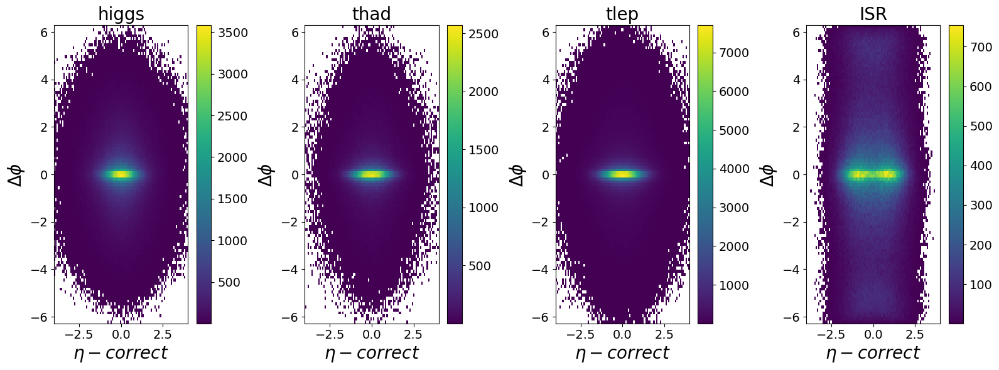

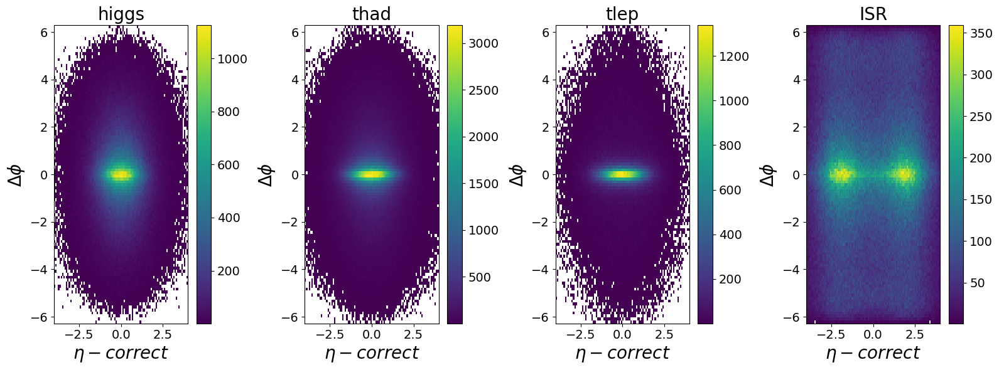

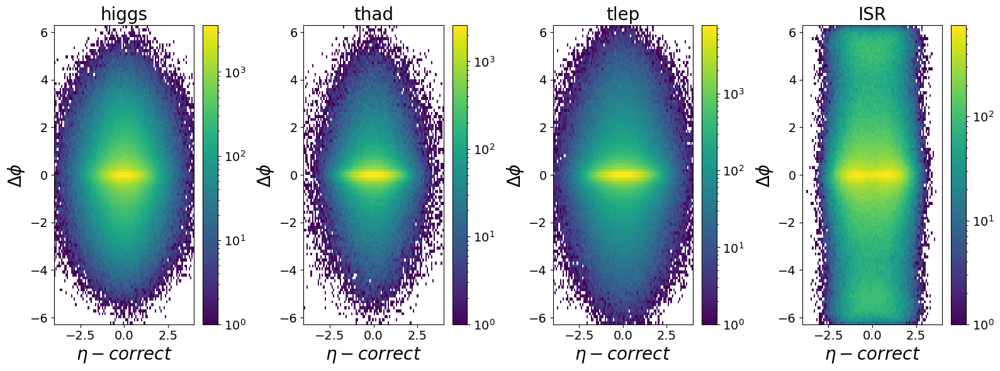

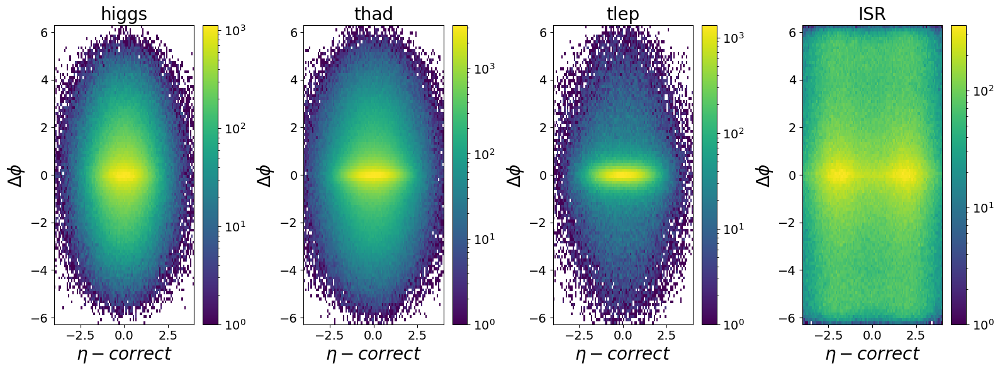

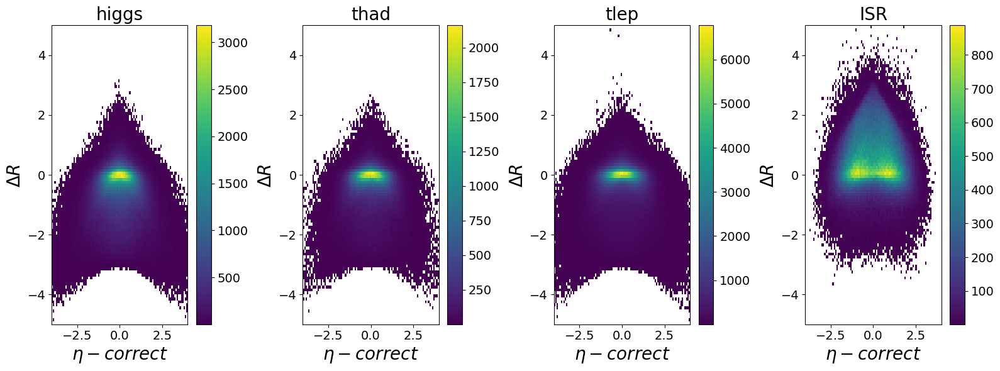

...

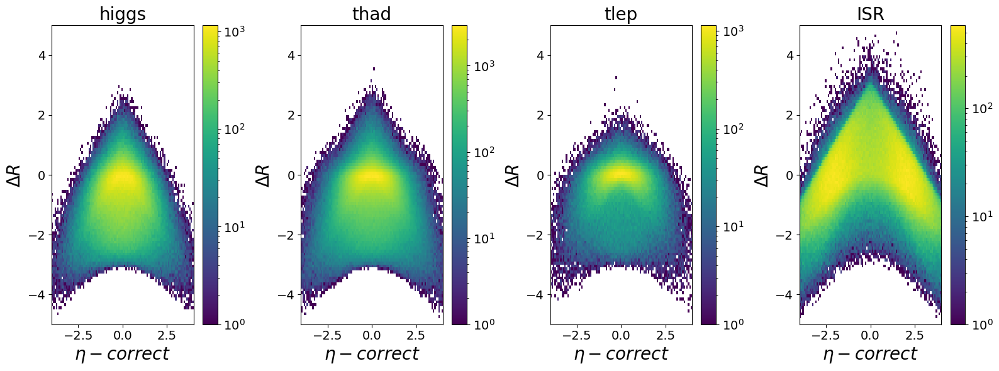

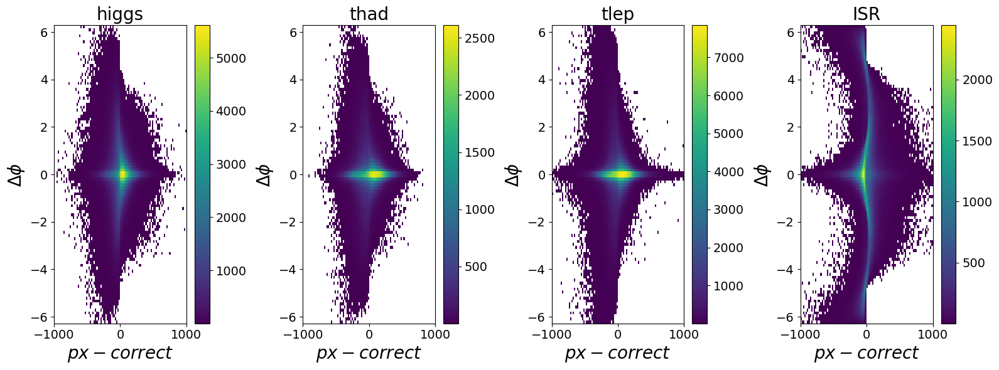

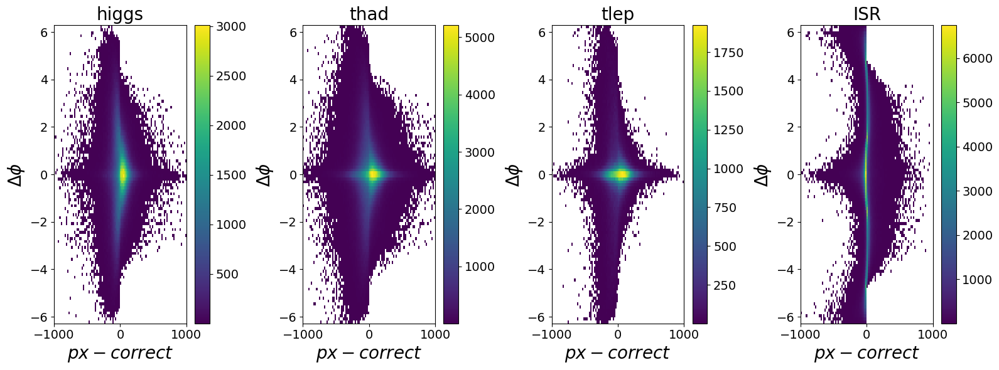

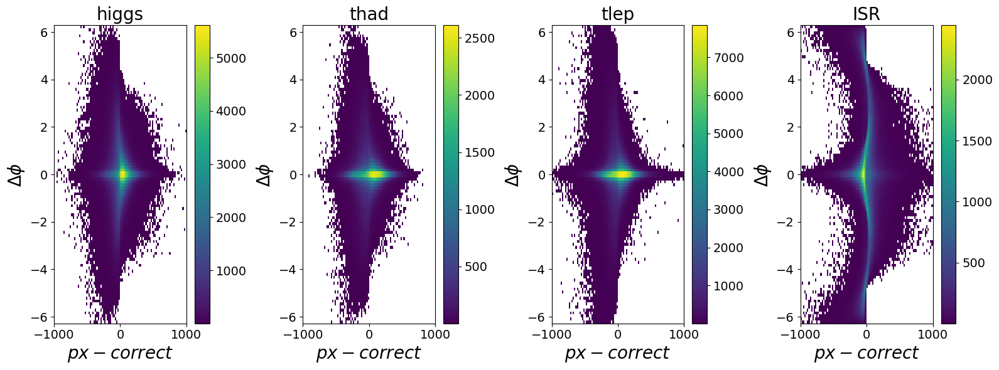

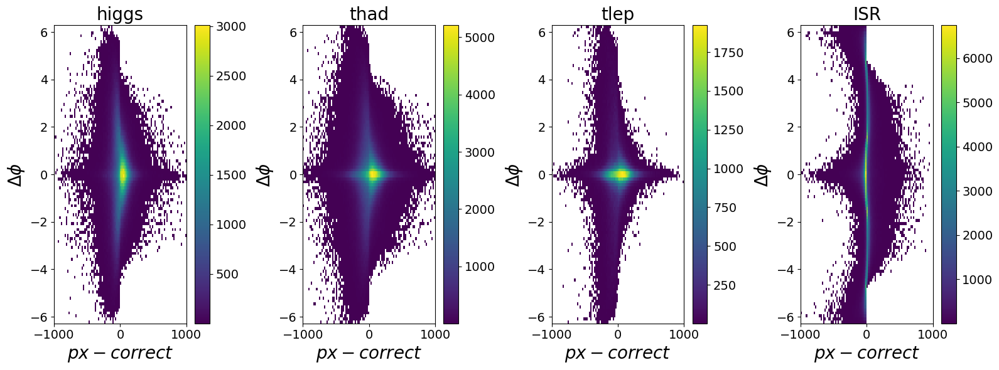

In [25]:
#eta vs diff_phi
higgs_DiffPhi = higgsCorrect.phi - higgs.phi
thad_DiffPhi = thadCorrect.phi - thad.phi
tlep_DiffPhi = tlepCorrect.phi - tlep.phi
glISR_DiffPhi = glISRCorrect.phi - glISR.phi

plots.plot_var2d(higgs_var1=higgsCorrect.eta, higgs_var2=higgs_DiffPhi,
           thad_var1=thadCorrect.eta, thad_var2=thad_DiffPhi,
           tlep_var1=tlepCorrect.eta, tlep_var2=tlep_DiffPhi,
           ISR_var1=glISRCorrect.eta, ISR_var2=glISR_DiffPhi,
           name1='$\eta-correct$', name2='$\Delta \phi$', nameFig='49.png', 
           start1=-4, stop1=4, start2=-2*pi, stop2=2*pi, bins1=100, bins2=100,
           higgs_mask=higgs_mask, thad_mask=thad_mask, tlep_mask=tlep_mask, ISR_mask=ISR_mask,
           neg_Mask=False, log=False)

plots.plot_var2d(higgs_var1=higgsCorrect.eta, higgs_var2=higgs_DiffPhi,
           thad_var1=thadCorrect.eta, thad_var2=thad_DiffPhi,
           tlep_var1=tlepCorrect.eta, tlep_var2=tlep_DiffPhi,
           ISR_var1=glISRCorrect.eta, ISR_var2=glISR_DiffPhi,
           name1='$\eta-correct$', name2='$\Delta \phi$', nameFig='50.png', 
           start1=-4, stop1=4, start2=-2*pi, stop2=2*pi, bins1=100, bins2=100,
           higgs_mask=higgs_mask, thad_mask=thad_mask, tlep_mask=tlep_mask, ISR_mask=ISR_mask,
           neg_Mask=True, log=False)

plots.plot_var2d(higgs_var1=higgsCorrect.eta, higgs_var2=higgs_DiffPhi,
           thad_var1=thadCorrect.eta, thad_var2=thad_DiffPhi,
           tlep_var1=tlepCorrect.eta, tlep_var2=tlep_DiffPhi,
           ISR_var1=glISRCorrect.eta, ISR_var2=glISR_DiffPhi,
           name1='$\eta-correct$', name2='$\Delta \phi$', nameFig='51.png', 
           start1=-4, stop1=4, start2=-2*pi, stop2=2*pi, bins1=100, bins2=100,
           higgs_mask=higgs_mask, thad_mask=thad_mask, tlep_mask=tlep_mask, ISR_mask=ISR_mask,
           neg_Mask=False, log=True)

plots.plot_var2d(higgs_var1=higgsCorrect.eta, higgs_var2=higgs_DiffPhi,
           thad_var1=thadCorrect.eta, thad_var2=thad_DiffPhi,
           tlep_var1=tlepCorrect.eta, tlep_var2=tlep_DiffPhi,
           ISR_var1=glISRCorrect.eta, ISR_var2=glISR_DiffPhi,
           name1='$\eta-correct$', name2='$\Delta \phi$', nameFig='52.png', 
           start1=-4, stop1=4, start2=-2*pi, stop2=2*pi, bins1=100, bins2=100,
           higgs_mask=higgs_mask, thad_mask=thad_mask, tlep_mask=tlep_mask, ISR_mask=ISR_mask,
           neg_Mask=True, log=True)

# eta vs Diff_R
higgs_DiffR = np.sqrt(higgs.phi**2 + higgs.eta**2) -  np.sqrt(higgsCorrect.phi**2 + higgsCorrect.eta**2)
thad_DiffR = np.sqrt(thad.phi**2 + thad.eta**2) -  np.sqrt(thadCorrect.phi**2 + thadCorrect.eta**2)
tlep_DiffR = np.sqrt(tlep.phi**2 + tlep.eta**2) -  np.sqrt(tlepCorrect.phi**2 + tlepCorrect.eta**2)
glISR_DiffR = np.sqrt(glISR.phi**2 + glISR.eta**2) -  np.sqrt(glISRCorrect.phi**2 + glISRCorrect.eta**2)

plots.plot_var2d(higgs_var1=higgsCorrect.eta, higgs_var2=higgs_DiffR,
           thad_var1=thadCorrect.eta, thad_var2=thad_DiffR,
           tlep_var1=tlepCorrect.eta, tlep_var2=tlep_DiffR,
           ISR_var1=glISRCorrect.eta, ISR_var2=glISR_DiffR,
           name1='$\eta-correct$', name2='$\Delta R$', nameFig='53.png', 
           start1=-4, stop1=4, start2=-5, stop2=5, bins1=100, bins2=100,
           higgs_mask=higgs_mask, thad_mask=thad_mask, tlep_mask=tlep_mask, ISR_mask=ISR_mask,
           neg_Mask=False, log=False)

plots.plot_var2d(higgs_var1=higgsCorrect.eta, higgs_var2=higgs_DiffR,
           thad_var1=thadCorrect.eta, thad_var2=thad_DiffR,
           tlep_var1=tlepCorrect.eta, tlep_var2=tlep_DiffR,
           ISR_var1=glISRCorrect.eta, ISR_var2=glISR_DiffR,
           name1='$\eta-correct$', name2='$\Delta R$', nameFig='54.png', 
           start1=-4, stop1=4, start2=-5, stop2=5, bins1=100, bins2=100,
           higgs_mask=higgs_mask, thad_mask=thad_mask, tlep_mask=tlep_mask, ISR_mask=ISR_mask,
           neg_Mask=True, log=False)

plots.plot_var2d(higgs_var1=higgsCorrect.eta, higgs_var2=higgs_DiffR,
           thad_var1=thadCorrect.eta, thad_var2=thad_DiffR,
           tlep_var1=tlepCorrect.eta, tlep_var2=tlep_DiffR,
           ISR_var1=glISRCorrect.eta, ISR_var2=glISR_DiffR,
           name1='$\eta-correct$', name2='$\Delta R$', nameFig='55.png', 
           start1=-4, stop1=4, start2=-5, stop2=5, bins1=100, bins2=100,
           higgs_mask=higgs_mask, thad_mask=thad_mask, tlep_mask=tlep_mask, ISR_mask=ISR_mask,
           neg_Mask=False, log=True)

plots.plot_var2d(higgs_var1=higgsCorrect.eta, higgs_var2=higgs_DiffR,
           thad_var1=thadCorrect.eta, thad_var2=thad_DiffR,
           tlep_var1=tlepCorrect.eta, tlep_var2=tlep_DiffR,
           ISR_var1=glISRCorrect.eta, ISR_var2=glISR_DiffR,
           name1='$\eta-correct$', name2='$\Delta R$', nameFig='56.png', 
           start1=-4, stop1=4, start2=-5, stop2=5, bins1=100, bins2=100,
           higgs_mask=higgs_mask, thad_mask=thad_mask, tlep_mask=tlep_mask, ISR_mask=ISR_mask,
           neg_Mask=True, log=True)

#px vs diff_phi

plots.plot_var2d(higgs_var1=higgsCorrect.px, higgs_var2=higgs_DiffPhi,
           thad_var1=thadCorrect.px, thad_var2=thad_DiffPhi,
           tlep_var1=tlepCorrect.px, tlep_var2=tlep_DiffPhi,
           ISR_var1=glISRCorrect.px, ISR_var2=glISR_DiffPhi,
           name1='$px-correct$', name2='$\Delta \phi$', nameFig='57.png', 
           start1=-1000, stop1=1000, start2=-2*pi, stop2=2*pi, bins1=100, bins2=100,
           higgs_mask=higgs_mask, thad_mask=thad_mask, tlep_mask=tlep_mask, ISR_mask=ISR_mask,
           neg_Mask=False, log=False)

plots.plot_var2d(higgs_var1=higgsCorrect.px, higgs_var2=higgs_DiffPhi,
           thad_var1=thadCorrect.px, thad_var2=thad_DiffPhi,
           tlep_var1=tlepCorrect.px, tlep_var2=tlep_DiffPhi,
           ISR_var1=glISRCorrect.px, ISR_var2=glISR_DiffPhi,
           name1='$px-correct$', name2='$\Delta \phi$', nameFig='58.png', 
           start1=-1000, stop1=1000, start2=-2*pi, stop2=2*pi, bins1=100, bins2=100,
           higgs_mask=higgs_mask, thad_mask=thad_mask, tlep_mask=tlep_mask, ISR_mask=ISR_mask,
           neg_Mask=True, log=False)

plots.plot_var2d(higgs_var1=higgsCorrect.px, higgs_var2=higgs_DiffPhi,
           thad_var1=thadCorrect.px, thad_var2=thad_DiffPhi,
           tlep_var1=tlepCorrect.px, tlep_var2=tlep_DiffPhi,
           ISR_var1=glISRCorrect.px, ISR_var2=glISR_DiffPhi,
           name1='$px-correct$', name2='$\Delta \phi$', nameFig='59.png', 
           start1=-1000, stop1=1000, start2=-2*pi, stop2=2*pi, bins1=100, bins2=100,
           higgs_mask=higgs_mask, thad_mask=thad_mask, tlep_mask=tlep_mask, ISR_mask=ISR_mask,
           neg_Mask=False, log=False)

plots.plot_var2d(higgs_var1=higgsCorrect.px, higgs_var2=higgs_DiffPhi,
           thad_var1=thadCorrect.px, thad_var2=thad_DiffPhi,
           tlep_var1=tlepCorrect.px, tlep_var2=tlep_DiffPhi,
           ISR_var1=glISRCorrect.px, ISR_var2=glISR_DiffPhi,
           name1='$px-correct$', name2='$\Delta \phi$', nameFig='60.png', 
           start1=-1000, stop1=1000, start2=-2*pi, stop2=2*pi, bins1=100, bins2=100,
           higgs_mask=higgs_mask, thad_mask=thad_mask, tlep_mask=tlep_mask, ISR_mask=ISR_mask,
           neg_Mask=True, log=False)

# Rambo

In [19]:
data_phasespace = data.parton_data.phasespace_intermediateParticles
data_phasespaceDet = data.parton_data.phasespace_rambo_detjacobian
data_boostReco = data.reco_data.data_boost.squeeze(axis=1)

E_CM = 13000
phasespace = PhaseSpace(E_CM, [21, 21], [25, 6, -6, 21], dev="cpu")

# Using Boost from reco data

In [20]:
x1 = (data_boostReco[:, 0] + data_boostReco[:, 3]) / E_CM
x2 = (data_boostReco[:, 0] - data_boostReco[:, 3]) / E_CM
    
ps_regressed, detjinv_regressed = phasespace.get_ps_from_momenta(new_data_regressed, x1, x2, ensure_CM=True)
ps_regressed = torch.nan_to_num(ps_regressed, nan=-0.03)

In [21]:
print(ps_regressed.shape)

torch.Size([1414130, 10])


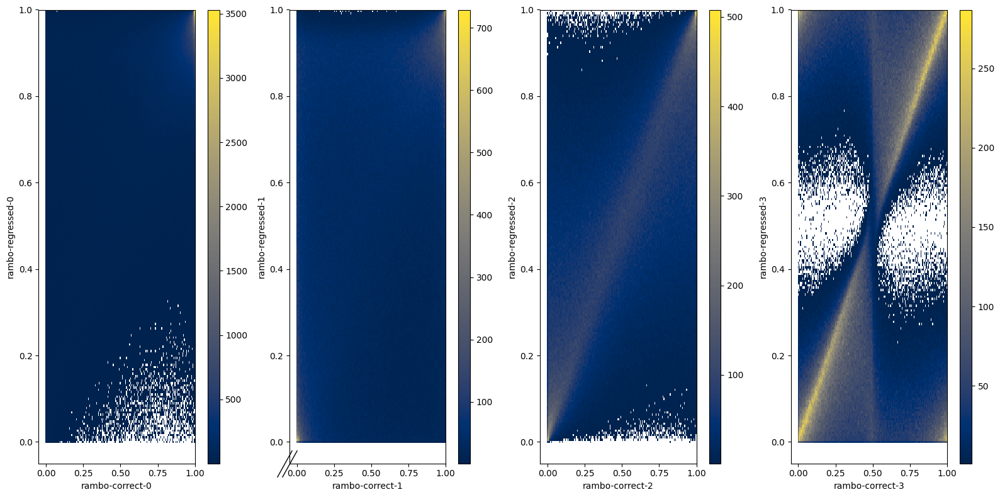

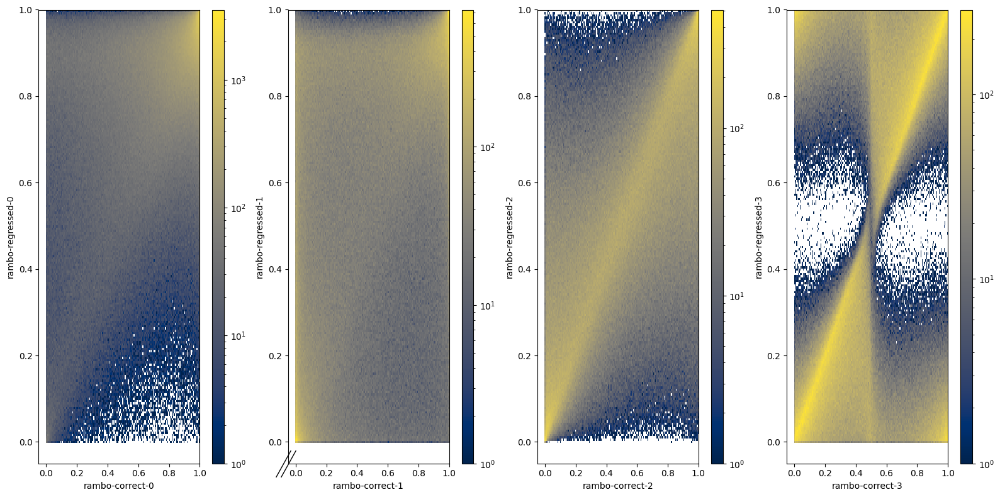

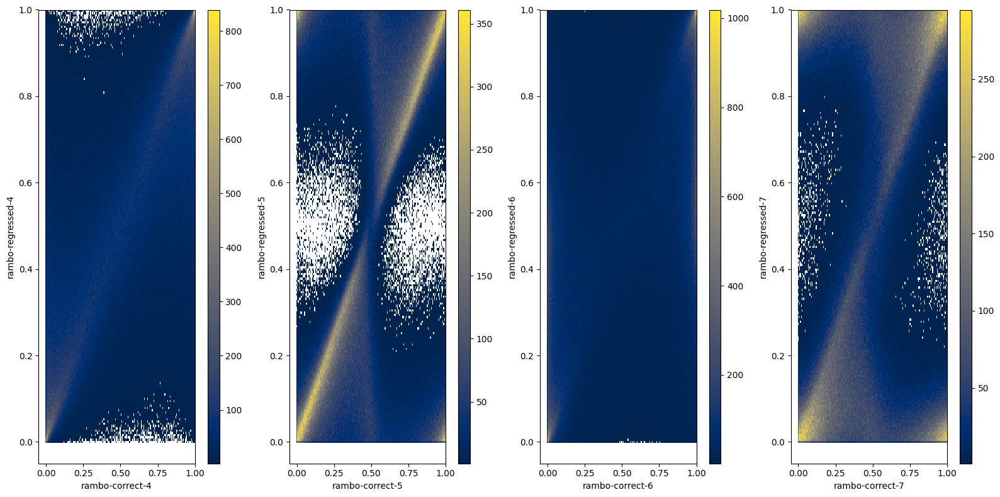

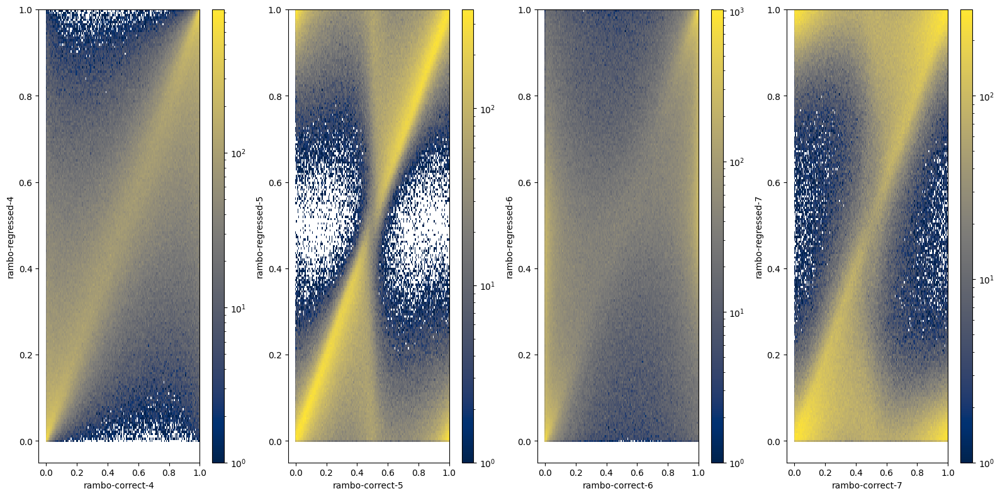

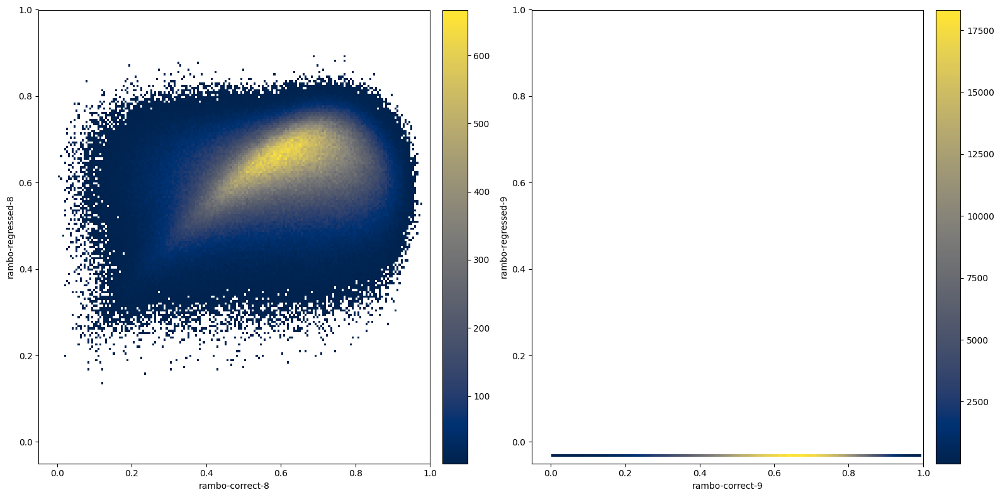

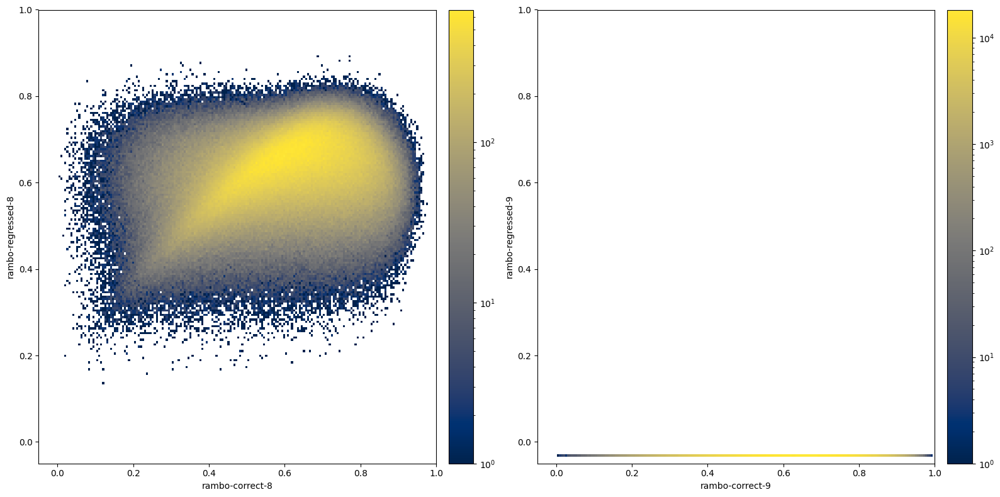

In [22]:
for i in range(3):
        numberFig = 61+2*i
        plots.plot_rambo(data_phasespace.detach().numpy(), ps_regressed.detach().numpy(),
                         nameFig=f'{numberFig}.png', typePlot=i, log=False)
        
        plots.plot_rambo(data_phasespace.detach().numpy(), ps_regressed.detach().numpy(),
                         nameFig=f'{numberFig+1}.png', typePlot=i, log=True)

# Using Boost from regressed data

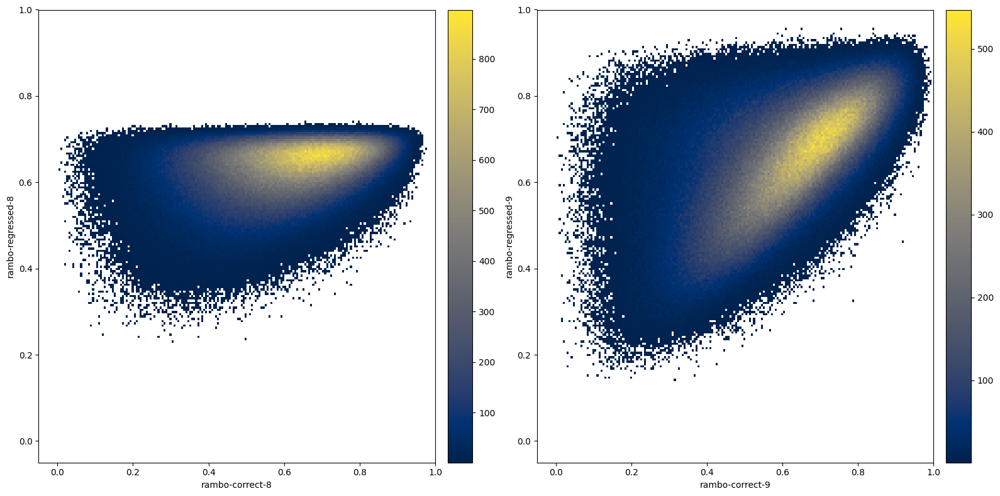

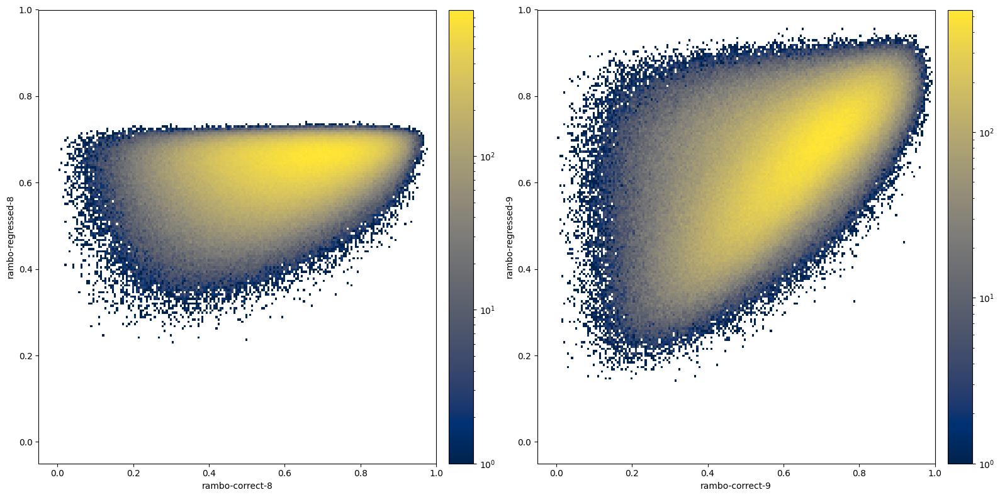

In [23]:
x1 = (boost_regressed[:, 0] + boost_regressed[:, 3]) / E_CM
x2 = (boost_regressed[:, 0] - boost_regressed[:, 3]) / E_CM
    
ps_regressed, detjinv_regressed = phasespace.get_ps_from_momenta(new_data_regressed, x1, x2, ensure_CM=True)
ps_regressed = torch.nan_to_num(ps_regressed, nan=-0.03)

numberFig = 67
# Here compute only x1/x2 (rest of plots look the same as above)
plots.plot_rambo(data_phasespace.detach().numpy(), ps_regressed.detach().numpy(),
                         nameFig=f'{numberFig}.png', typePlot=2, log=False)
        
plots.plot_rambo(data_phasespace.detach().numpy(), ps_regressed.detach().numpy(),
                         nameFig=f'{numberFig+1}.png', typePlot=2, log=True)